In [34]:
import os
os.environ["CRDS_PATH"] = os.path.expanduser("~/crds_cache")
os.makedirs(os.environ["CRDS_PATH"], exist_ok=True)

os.environ["CRDS_SERVER_URL"] = "https://jwst-crds.stsci.edu"
os.environ["CRDS_CONTEXT"] = "jwst_1460.pmap"

from astropy.table import Table
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
from astroquery.svo_fps import SvoFps
from astropy.wcs import WCS
from astropy.io import fits
from dust_extinction.averages import RL85_MWGC, CT06_MWLoc
from dust_extinction.parameter_averages import CCM89

def get_mag(catalog, ww, filtername='f140m' ):
    print(ww.proj_plane_pixel_area())
    
    flux= (catalog['flux_fit_' + filtername] * u.MJy/u.sr * ww.proj_plane_pixel_area()).to(u.Jy)
    eflux_jy = (catalog['flux_err_' + filtername] * u.MJy/u.sr *  ww.proj_plane_pixel_area()).to(u.Jy)

    jfilts = SvoFps.get_filter_list('JWST')
    jfilts.add_index('filterID')
    wav = int(filtername[1:-1])

    zeropoint_ab = 3631 * u.Jy  # Default to AB magnitude zero point
 
    if wav < 500:

        zeropoint_vega = u.Quantity(jfilts.loc[f'JWST/NIRCam.{filtername.upper()}']['ZeroPoint'], u.Jy)
    else:
        zeropoint_vega = u.Quantity(jfilts.loc[f'JWST/MIRI.{filtername.upper()}']['ZeroPoint'], u.Jy)
   
    abmag = -2.5 * np.log10(flux / zeropoint_ab) * u.mag
    abmag_err = 2.5 / np.log(10) * np.abs(eflux_jy / flux) * u.mag

    vegamag = -2.5 * np.log10(flux / zeropoint_vega) * u.mag
    vegamag_err = 2.5 / np.log(10) * np.abs(eflux_jy / flux) * u.mag

    return  vegamag, vegamag_err, abmag, abmag_err


image_filenames ={
    "f140m": "/orange/adamginsburg/jwst/w51/F140M/pipeline/jw06151-o001_t001_nircam_clear-f140m-merged_i2d.fits",
    "f150w": "/orange/adamginsburg/jwst/w51/F150W/pipeline/jw06151-o001_t001_nircam_clear-f150w-merged_i2d.fits",
    "f162m": "/orange/adamginsburg/jwst/w51/F162M/pipeline/jw06151-o001_t001_nircam_clear-f162m-merged_i2d.fits",
    "f182m": "/orange/adamginsburg/jwst/w51/F182M/pipeline/jw06151-o001_t001_nircam_clear-f182m-merged_i2d.fits",
    "f187n": "/orange/adamginsburg/jwst/w51/F187N/pipeline/jw06151-o001_t001_nircam_clear-f187n-merged_i2d.fits",
    "f210m": "/orange/adamginsburg/jwst/w51/F210M/pipeline/jw06151-o001_t001_nircam_clear-f210m-merged_i2d.fits",
    "f335m": "/orange/adamginsburg/jwst/w51/F335M/pipeline/jw06151-o001_t001_nircam_clear-f335m-merged_i2d.fits",
    "f360m": "/orange/adamginsburg/jwst/w51/F360M/pipeline/jw06151-o001_t001_nircam_clear-f360m-merged_i2d.fits",
    "f405n": "/orange/adamginsburg/jwst/w51/F405N/pipeline/jw06151-o001_t001_nircam_clear-f405n-merged_i2d.fits",
    "f410m": "/orange/adamginsburg/jwst/w51/F410M/pipeline/jw06151-o001_t001_nircam_clear-f410m-merged_i2d.fits", # weird, the filename is different from what is downloaded with the STScI pipeline...
    "f480m": "/orange/adamginsburg/jwst/w51/F480M/pipeline/jw06151-o001_t001_nircam_clear-f480m-merged_i2d.fits",
    "f560w": "/orange/adamginsburg/jwst/w51/F560W/pipeline/jw06151-o002_t001_miri_f560w_i2d.fits",
    "f770w": "/orange/adamginsburg/jwst/w51/F770W/pipeline/jw06151-o002_t001_miri_f770w_i2d.fits",
    "f1000w": "/orange/adamginsburg/jwst/w51/F1000W/pipeline/jw06151-o002_t001_miri_f1000w_i2d.fits",
    "f1280w": "/orange/adamginsburg/jwst/w51/F1280W/pipeline/jw06151-o002_t001_miri_f1280w_i2d.fits",
    "f2100w": "/orange/adamginsburg/jwst/w51/F2100W/pipeline/jw06151-o002_t001_miri_f2100w_i2d.fits",
    
}
catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/final_catalog_new.fits')
nmatch = catalog['nmatch_bands']
catalog = catalog[nmatch>3]
print(catalog.colnames)


f140m_header = fits.getheader(image_filenames['f140m'], ext=('SCI', 1))
f162m_header = fits.getheader(image_filenames['f162m'], ext=('SCI', 1))
f182m_header = fits.getheader(image_filenames['f182m'], ext=('SCI', 1))
f210m_header = fits.getheader(image_filenames['f210m'], ext=('SCI', 1))
f335m_header = fits.getheader(image_filenames['f335m'], ext=('SCI', 1))
f360m_header = fits.getheader(image_filenames['f360m'], ext=('SCI', 1))
f405n_header = fits.getheader(image_filenames['f405n'], ext=('SCI', 1))
f410m_header = fits.getheader(image_filenames['f410m'], ext=('SCI', 1))
f480m_header = fits.getheader(image_filenames['f480m'], ext=('SCI', 1))
f560w_header = fits.getheader(image_filenames['f560w'], ext=('SCI', 1))
f770w_header = fits.getheader(image_filenames['f770w'], ext=('SCI', 1))
f1000w_header = fits.getheader(image_filenames['f1000w'], ext=('SCI', 1))
f1280w_header = fits.getheader(image_filenames['f1280w'], ext=('SCI', 1))
f2100w_header = fits.getheader(image_filenames['f2100w'], ext=('SCI', 1))

print(f140m_header)

f140m_mag = get_mag(catalog, WCS(f140m_header), filtername='f140m')
f162m_mag = get_mag(catalog, WCS(f162m_header), filtername='f162m')
f182m_mag = get_mag(catalog, WCS(f182m_header), filtername='f182m')
f210m_mag = get_mag(catalog, WCS(f210m_header), filtername='f210m')
f335m_mag = get_mag(catalog, WCS(f335m_header), filtername='f335m')
f360m_mag = get_mag(catalog, WCS(f360m_header), filtername='f360m')
f405n_mag = get_mag(catalog, WCS(f405n_header), filtername='f405n')
f410m_mag = get_mag(catalog, WCS(f410m_header), filtername='f410m')
f480m_mag = get_mag(catalog, WCS(f480m_header), filtername='f480m')
f560w_mag = get_mag(catalog, WCS(f560w_header), filtername='f560w')
f770w_mag = get_mag(catalog, WCS(f770w_header), filtername='f770w')
f1000w_mag = get_mag(catalog, WCS(f1000w_header), filtername='f1000w')
f1280w_mag = get_mag(catalog, WCS(f1280w_header), filtername='f1280w')
f2100w_mag = get_mag(catalog, WCS(f2100w_header), filtername='f2100w')

f187n_header = fits.getheader(image_filenames['f187n'], ext=('SCI', 1))
f187n_mag = get_mag(catalog, WCS(f187n_header), filtername='f187n')


from dust_extinction.averages import RL85_MWGC, CT06_MWGC
from dust_extinction.parameter_averages import CCM89
import astropy.constants as const

ext = RL85_MWGC()
ext = CT06_MWLoc()
def plot_extvec_cmd(ax, color1, mag1, ext=RL85_MWGC(), extvec_scale=200, start=None,
                    color='y', head_width=0.5, color1_data=None, mag1_data=None, label=None, fontsize=15):
    def get_wave(c):
        if c == '410m405': return 4.10*u.um
        if c == '405m410': return 4.05*u.um
        if c == 'Hmag': return 1.634*u.um
        if c == 'Ksmag': return 2.143527*u.um
        return int(c[1:-1])/100*u.um

    w1 = get_wave(color1[0])
    w2 = get_wave(color1[1])
    w3 = get_wave(mag1[0])

    if w1 > w2:
        w1, w2 = w2, w1
        color1 = color1[::-1]
    print(w1,w2,w3)

    # Only plot if all are in valid range
    try:
        e_1 = ext(1/w1) * extvec_scale
        e_2 = ext(1/w2) * extvec_scale
        e_3 = ext(1/w3) * extvec_scale
    except ValueError as e:
        print(f"Extinction vector not plotted: {e}")
        return
    print(w1,w2,w3)
    print(e_1, e_2, e_3)
    if start == None:
        mean_color1 = np.nanmean(color1_data)
        mean_mag1 = np.nanmean(mag1_data)
        std_color1 = np.nanstd(color1_data)
        std_mag1 = np.nanstd(mag1_data)
        if e_1 - e_2 < 0:
            std_color1 *= -1
        
    
        start2 = (mean_color1 + 2*std_color1, mean_mag1 + 2*std_mag1)
    else:
        start2 = start
    
    # Strip units for plotting if present
    if hasattr(start2[0], 'value'):
        start2_x = start2[0].value
        start2_y = start2[1].value
    else:
        start2_x = start2[0]
        start2_y = start2[1]

    ax.annotate(f'$A_V={extvec_scale}$', xy=(start2_x + (e_1 - e_2), start2_y + e_3),
                xytext=(start2_x, start2_y), fontsize=15,
                arrowprops=dict(arrowstyle='-|>', color=color,
                                shrinkA=0, shrinkB=0,
                                mutation_scale=20, linewidth=1.5))
    if label is not None:
        ax.plot([], [], color=color, marker='>', markersize=8,
                label=f'{label}', linestyle='-', linewidth=2)

    else:
        ax.plot([], [], color=color, marker='>', markersize=8,
                linestyle='-', linewidth=2)

imgsavedir = '/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/plots/cmds/'
filters = {
    'f140m': f140m_mag,
    'f162m': f162m_mag,
    'f182m': f182m_mag,
    'f187n': f187n_mag,
    'f210m': f210m_mag,
    'f335m': f335m_mag,
    'f360m': f360m_mag,
    'f405n': f405n_mag,
    'f410m': f410m_mag,
    'f480m': f480m_mag,
    'f560w': f560w_mag,
    'f770w': f770w_mag,
    'f1000w': f1000w_mag,
    'f1280w': f1280w_mag,
    'f2100w': f2100w_mag,
}
filter_names = list(filters.keys())

def get_line_excess(catalog, narrow, wide):
    # --- Convert catalog MJy/sr → Jy ---
    ww_narrow = WCS(fits.getheader(image_filenames[narrow], ext=('SCI', 1)))
    ww_wide = WCS(fits.getheader(image_filenames[wide], ext=('SCI', 1)))

    data_narrow = (catalog['flux_fit_' + narrow] * u.MJy/u.sr *
                   ww_narrow.proj_plane_pixel_area()).to(u.Jy)
    data_wide = (catalog['flux_fit_' + wide] * u.MJy/u.sr *
                 ww_wide.proj_plane_pixel_area()).to(u.Jy)

    # --- Load filter curves ---
    tab_n = SvoFps.get_transmission_data(f'JWST/NIRCAM.{narrow}')
    tab_w = SvoFps.get_transmission_data(f'JWST/NIRCAM.{wide}')

    wave_n = tab_n['Wavelength'] * u.AA
    trans_n = tab_n['Transmission']

    wave_w = tab_w['Wavelength'] * u.AA
    trans_w = tab_w['Transmission']

    # --- Interpolate narrow onto wide grid ---
    trans_n_interp = np.interp(wave_w.value, wave_n.value, trans_n)

    # --- Fractional overlap (proper integral) ---
    num = np.trapezoid(
    (trans_w / trans_w.max()) * (trans_n_interp / trans_n.max()),
    wave_w.value
    )
    den = np.trapezoid(trans_w / trans_w.max(), wave_w.value)
    f = num / den

    if np.isclose(f, 1.0):
        return None, None

    # --- Continuum & line (still in Jy = F_nu) ---
    cont_nu = (data_wide - data_narrow * f) / (1 - f)
    line_nu = data_narrow - cont_nu

    width_narrow = np.trapezoid(trans_n / trans_n.max(), wave_n.value) * u.AA

    # --- Equivalent Width ---
    with np.errstate(divide='ignore', invalid='ignore'):
        ew = (line_nu / cont_nu) * width_narrow

    return line_nu.value, ew.to_value(u.AA)

paa_excess,  paa_excess_ew = get_line_excess(catalog, 'f187n', 'f182m')
bra_excess,  bra_excess_ew = get_line_excess(catalog, 'f405n', 'f410m')

print('paa_excess', paa_excess)

print(f140m_header.get("CAL_VER"))      # Calibration software version
print(f140m_header.get("CRDS_VER"))     # CRDS version
print(f140m_header.get("CRDS_CTX"))     # CRDS context
hdu = fits.open(image_filenames['f140m'])[0]
print(hdu.header["CAL_VER"])      # Calibration software version
   

['skycoord_ref', 'skycoord_ref_filtername', 'sep_f140m', 'id_f140m', 'skycoord_f140m', 'flux_fit_f140m', 'flux_err_f140m', 'mask_f140m', 'qfit_f140m', 'cfit_f140m', 'local_bkg_f140m', 'roundness1_f140m', 'roundness2_f140m', 'sharpness_f140m', 'from_sat_catalog_f140m', 'std_ra_f140m', 'std_dec_f140m', 'nmatch_f140m', 'nmatch_good_f140m', 'flux_err_prop_f140m', 'sep_f162m', 'id_f162m', 'skycoord_f162m', 'flux_fit_f162m', 'flux_err_f162m', 'mask_f162m', 'qfit_f162m', 'cfit_f162m', 'local_bkg_f162m', 'roundness1_f162m', 'roundness2_f162m', 'sharpness_f162m', 'from_sat_catalog_f162m', 'std_ra_f162m', 'std_dec_f162m', 'nmatch_f162m', 'nmatch_good_f162m', 'flux_err_prop_f162m', 'sep_f182m', 'id_f182m', 'skycoord_f182m', 'flux_fit_f182m', 'flux_err_f182m', 'mask_f182m', 'qfit_f182m', 'cfit_f182m', 'local_bkg_f182m', 'roundness1_f182m', 'roundness2_f182m', 'sharpness_f182m', 'from_sat_catalog_f182m', 'std_ra_f182m', 'std_dec_f182m', 'nmatch_f182m', 'nmatch_good_f182m', 'flux_err_prop_f182m', 's

Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/astropy/units/quantity.py:653: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/astropy/units/quantity.py:653: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
Set DATE-AVG to '2025-05-0

7.52510476872822e-11 deg2
7.52514718037244e-11 deg2
3.053877779107583e-10 deg2
3.0536898714608487e-10 deg2


Set DATE-AVG to '2025-05-06T14:19:01.510' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.130' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220310 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512065.053 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/astropy/units/quantity.py:653: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/astropy/units/quantity.py:653: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
Set DATE-AVG to '2025-05-0

3.056563930691893e-10 deg2
3.0541063885182936e-10 deg2
3.054668262896466e-10 deg2
9.491459138193236e-10 deg2


Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/astropy/units/quantity.py:653: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
Set DATE-AVG to '2024-09-08T11:22:58.102' from MJD-AVG.
Set DATE-END to '2024-09-08T12:35:44.015' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.810003 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291940033.618 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:31:04.265' from MJD-AVG.
Set DATE-END to '2024-09-08T12:43:52.463' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.803760 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291894033.527 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/astropy/units/quantity.py:653: RuntimeWarning: invalid value en

9.49145905084584e-10 deg2
9.491458943030916e-10 deg2
9.49145885655769e-10 deg2
9.491458757317268e-10 deg2


Set DATE-AVG to '2024-09-08T11:55:48.768' from MJD-AVG.
Set DATE-END to '2024-09-08T13:08:42.701' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.785099 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291756623.231 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T13:24:26.762' from MJD-AVG.
Set DATE-END to '2025-05-06T13:48:04.085' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.202551 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610191901.140 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/astropy/units/quantity.py:653: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
Set DATE-AVG to '2025-05-06T13:24:26.762' from MJD-AVG.
Set DATE-END to '2025-05-06T13:48:04.085' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.202551 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610191901.140 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '

7.524574264515582e-11 deg2
paa_excess [           nan 2.77610496e-09            nan ...            nan
            nan            nan]
None
None
None
1.21.0.dev314+g61bd2fe47


Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T13:24:26.757' from MJD-AVG.
Set DATE-END to '2025-05-06T13:48:04.021' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.202550 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610191894.941 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:06:02.828' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


1.4 um 1.62 um 1.4 um
1.4 um 1.62 um 1.4 um
7.129363200000001 5.382330074074073 7.129363200000001
1.4 um 1.62 um 1.4 um
1.4 um 1.62 um 1.4 um
7.0412946428571415 5.4357638888888875 7.0412946428571415
1.4 um 1.62 um 1.4 um
1.4 um 1.62 um 1.4 um
7.129363200000001 5.382330074074073 7.129363200000001
1.4 um 1.62 um 1.4 um
1.4 um 1.62 um 1.4 um
6.673350218462829 5.377005929042962 6.673350218462829
1.4 um 1.62 um 1.4 um
1.4 um 1.62 um 1.4 um
6.877352882900731 5.15745734947461 6.877352882900731
1.4 um 1.62 um 1.4 um
1.4 um 1.62 um 1.4 um
6.826596279085869 4.00178720911646 6.826596279085869


/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/dust_extinction/helpers.py:12: SpectralUnitsWarning: x has no units, assuming x units are inverse microns
  warnings.warn(


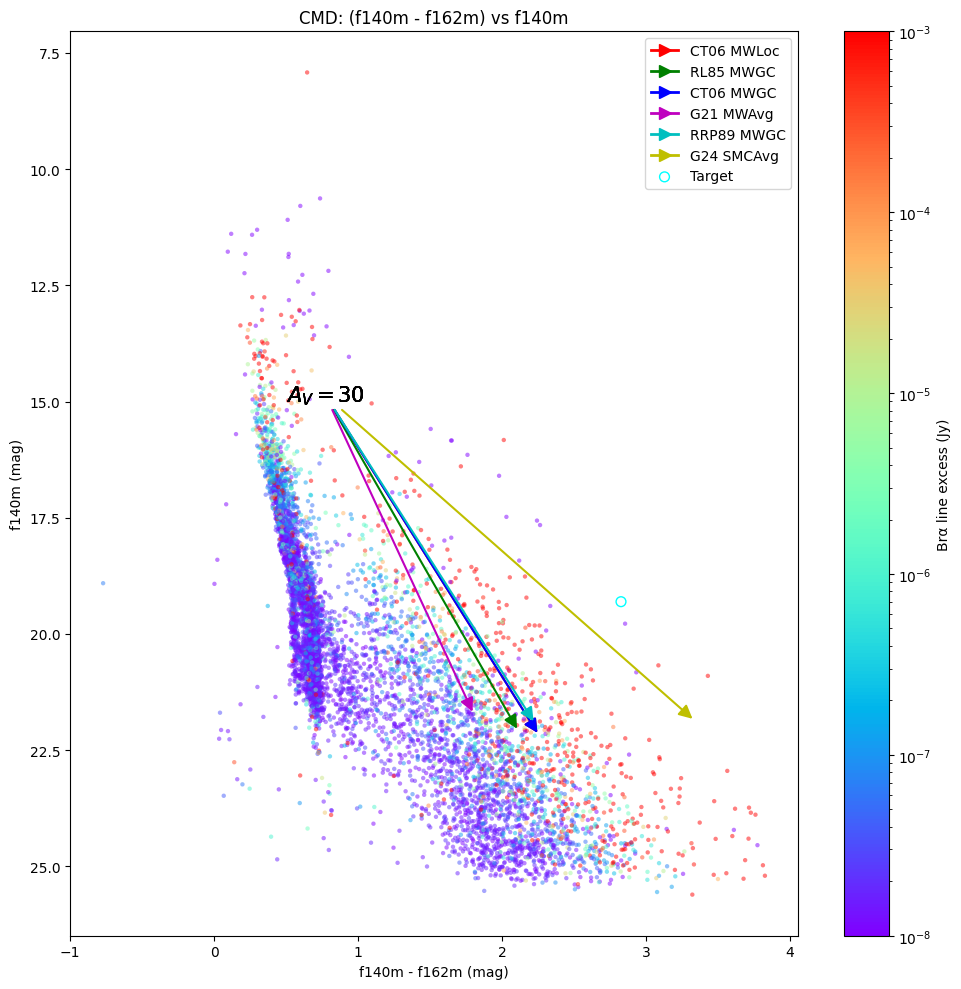

In [2]:
from astropy.coordinates import SkyCoord
from matplotlib.colors import LogNorm
ext = CT06_MWLoc()
# plot f140m-f162m color coded by f405n-f410m color
color = filters['f140m'][0] - filters['f162m'][0]
color_for_points = bra_excess

magnitude = filters['f140m'][0]


# Create plot
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)

#hb = ax.hexbin(color_valid, mag_valid, gridsize=100, cmap='inferno', mincnt=1, bins='log')
#cb = fig.colorbar(hb, ax=ax, label='log(N)')
cmap = plt.get_cmap('rainbow')

ax.scatter(color.value, magnitude.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none',vmin=np.nanpercentile(color_for_points, 10), vmax=np.nanpercentile(color_for_points, 90))
ax.set_xlabel('f140m - f162m (mag)')
ax.set_ylabel('f140m (mag)')
ax.set_title(f'CMD: (f140m - f162m) vs f140m')
ax.invert_yaxis()  # Invert y-axis for magnitude
from dust_extinction.averages import RL85_MWGC, CT06_MWLoc, G21_MWAvg,RRP89_MWGC, G24_SMCAvg
colorlist = ['r', 'g', 'b', 'm', 'c', 'y']
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    plot_extvec_cmd(ax, color1=('f140m', 'f162m'), mag1=('f140m',), 
                     ext=ext_model, extvec_scale=30, color=c, 
                     color1_data=color, mag1_data=magnitude, start=(0.5, 15), label=labels)
  



#add colorbar for the color coding
norm = LogNorm(vmin=1e-8, vmax=1e-3)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Brα line excess (Jy)')
plt.tight_layout()
#plt.savefig(f'{imgsavedir}cmd_{f1}_{f2}_vs_{mag_filter}.png', dpi=150)

skycoord_target = SkyCoord(ra=290.924875*u.deg, dec=14.5102237*u.deg, frame='icrs')
idx, d2d, _ = skycoord_target.match_to_catalog_sky(catalog['skycoord_ref'], nthneighbor=1)

ax.scatter(color[idx].value, magnitude[idx].value, s=50, edgecolor='cyan', facecolor='none', marker='o', label='Target')
ax.legend()


plt.show()

3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6323076923076927 0.69 0.69
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6526084768147404 1.0894231111576114 1.0894231111576114
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.9293004729897925 0.9708737864077621 0.9708737864077621
3.6 um 4.8 um 4.8 um
Extinction vector not plotted: Input x outside of range defined for G24_SMCAvg [0.3 <= x <= 10.0, x has units 1/micron]


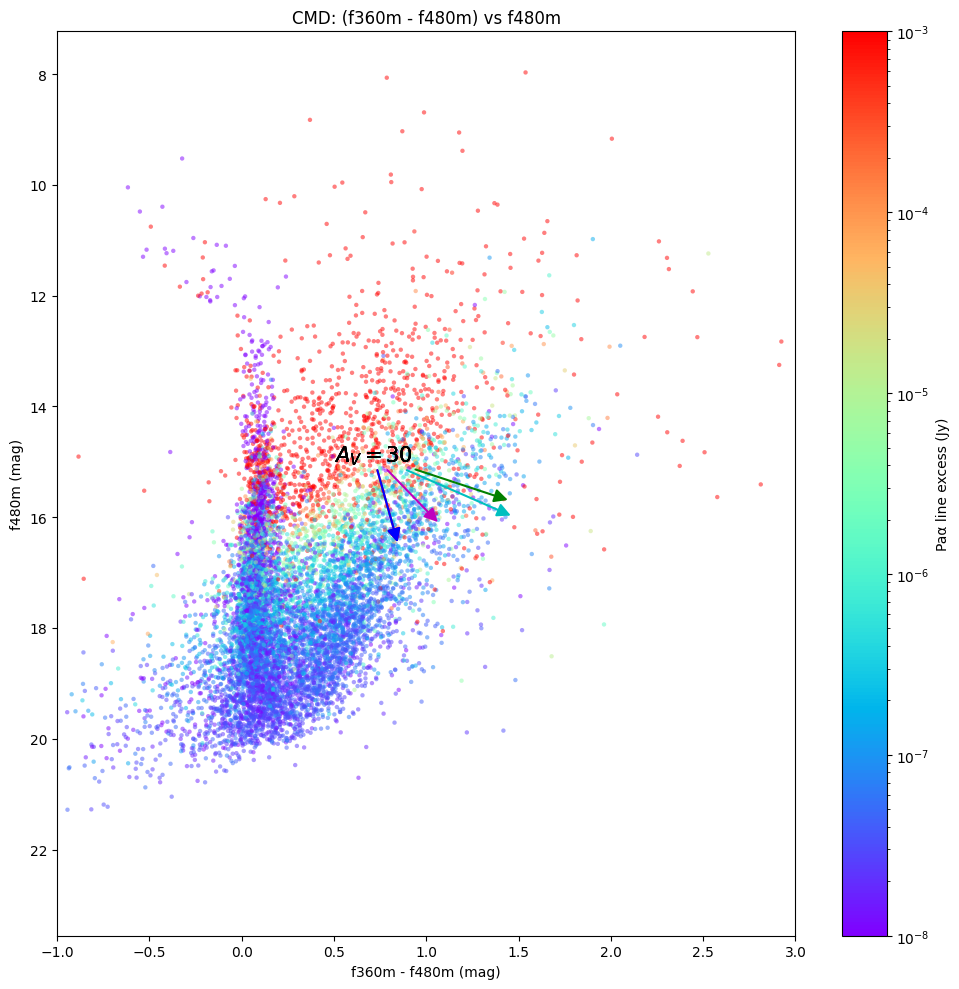

In [3]:
#f360-f480 vs f480-f560w, color coded by f187n-f182m (PaA excess)
color1 = filters['f360m'][0] - filters['f480m'][0]
mag1 = filters['f480m'][0]
color_for_points = paa_excess   
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
cmap = plt.get_cmap('rainbow')
ax.scatter(color1.value, mag1.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none',vmin=np.nanpercentile(color_for_points, 10), vmax=np.nanpercentile(color_for_points, 90))     
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('f480m (mag)')
ax.set_title(f'CMD: (f360m - f480m) vs f480m')
ax.invert_yaxis()  # Invert y-axis for magnitude
from dust_extinction.averages import RL85_MWGC, CT06_MWLoc, G21_MWAvg,RRP89_MWGC, G24_SMCAvg
colorlist = ['r', 'g', 'b', 'm', 'c', 'y']
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    plot_extvec_cmd(ax, color1=('f360m', 'f480m'), mag1=('f480m',), 
                     ext=ext_model, extvec_scale=30, color=c, 
                     color1_data=color, mag1_data=magnitude, start=(0.5, 15), label=labels)
#add colorbar for the color coding
norm = LogNorm(vmin=1e-8, vmax=1e-3)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Paα line excess (Jy)')
ax.set_xlim(-1, 3)
plt.tight_layout()


3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6323076923076927 0.69 0.69
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6526084768147404 1.0894231111576114 1.0894231111576114
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.9293004729897925 0.9708737864077621 0.9708737864077621
3.6 um 4.8 um 4.8 um
Extinction vector not plotted: Input x outside of range defined for G24_SMCAvg [0.3 <= x <= 10.0, x has units 1/micron]


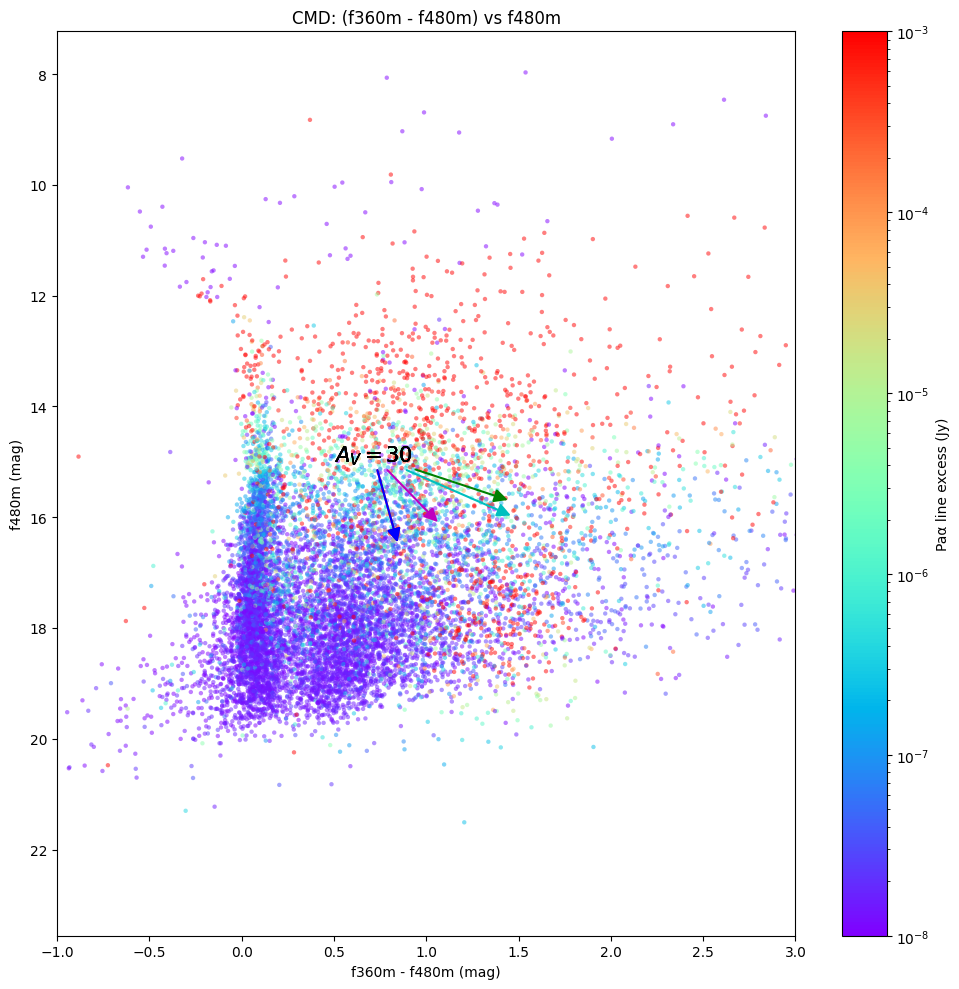

In [4]:
# same cmd color coded by Bra excess
color_for_points = bra_excess
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
cmap = plt.get_cmap('rainbow')
ax.scatter(color1.value, mag1.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none',vmin=np.nanpercentile(color_for_points, 10), vmax=np.nanpercentile(color_for_points, 90))
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('f480m (mag)')
ax.set_title(f'CMD: (f360m - f480m) vs f480m')
ax.invert_yaxis()  # Invert y-axis for magnitude
from dust_extinction.averages import RL85_MWGC, CT06_MWLoc, G21_MWAvg,RRP89_MWGC, G24_SMCAvg
colorlist = ['r', 'g', 'b', 'm', 'c', 'y'] 
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    plot_extvec_cmd(ax, color1=('f360m', 'f480m'), mag1=('f480m',), 
                     ext=ext_model, extvec_scale=30, color=c, 
                     color1_data=color, mag1_data=magnitude, start=(0.5, 15), label=labels)
#add colorbar for the color coding
norm = LogNorm(vmin=1e-8, vmax=1e-3)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Paα line excess (Jy)')
ax.set_xlim(-1, 3)
plt.tight_layout()


3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6323076923076927 0.69 0.69
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6526084768147404 1.0894231111576114 1.0894231111576114
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.9293004729897925 0.9708737864077621 0.9708737864077621
3.6 um 4.8 um 4.8 um
Extinction vector not plotted: Input x outside of range defined for G24_SMCAvg [0.3 <= x <= 10.0, x has units 1/micron]


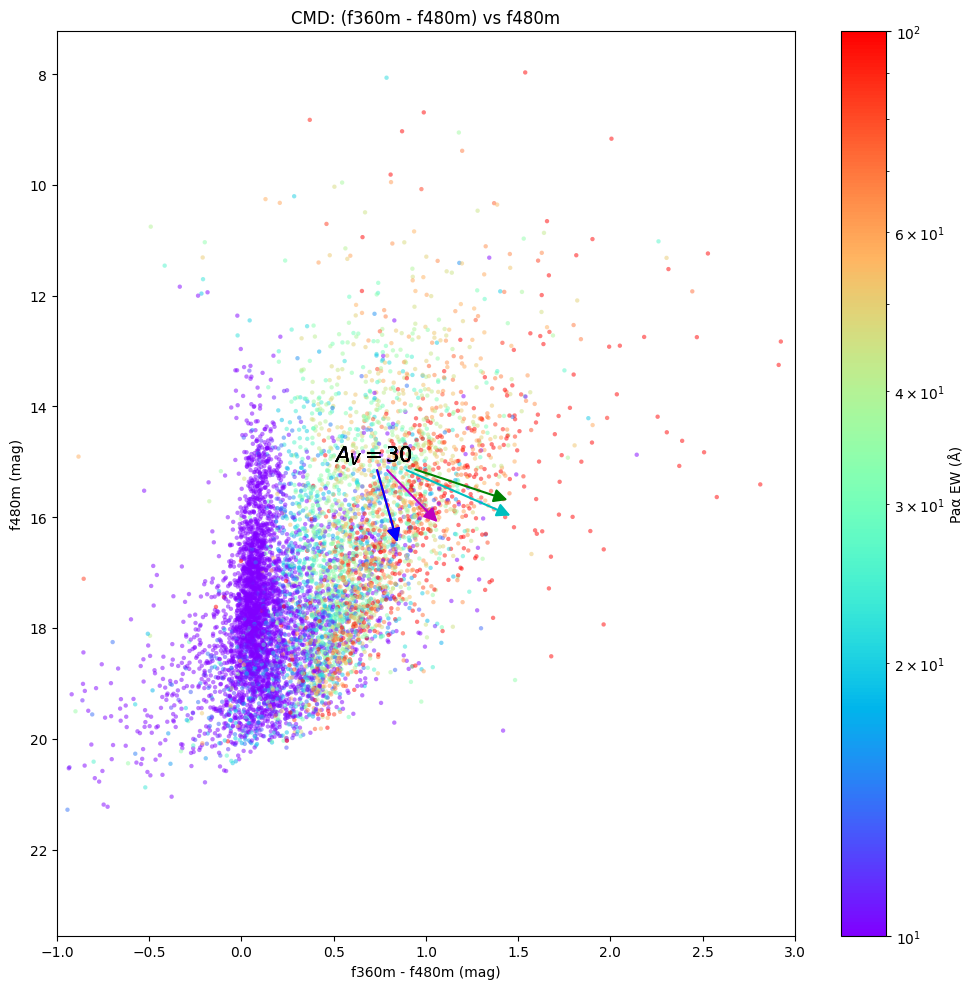

In [5]:
# same cmd for PaA EW
color_for_points = paa_excess_ew
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
cmap = plt.get_cmap('rainbow')
norm = LogNorm(vmin=10, vmax=100)

ax.scatter(color1.value, mag1.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none',norm=norm)     
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('f480m (mag)')
ax.set_title(f'CMD: (f360m - f480m) vs f480m')
ax.invert_yaxis()  # Invert y-axis for magnitude
from dust_extinction.averages import RL85_MWGC, CT06_MWLoc, G21_MWAvg,RRP89_MWGC, G24_SMCAvg
colorlist = ['r', 'g', 'b', 'm', 'c', 'y']
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    plot_extvec_cmd(ax, color1=('f360m', 'f480m'), mag1=('f480m',), 
                     ext=ext_model, extvec_scale=30, color=c, 
                     color1_data=color, mag1_data=magnitude, start=(0.5, 15), label=labels)
#add colorbar for the color coding
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Paα EW (Å)')
ax.set_xlim(-1, 3)
plt.tight_layout()

3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6323076923076927 0.69 0.69
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6526084768147404 1.0894231111576114 1.0894231111576114
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.9293004729897925 0.9708737864077621 0.9708737864077621
3.6 um 4.8 um 4.8 um
Extinction vector not plotted: Input x outside of range defined for G24_SMCAvg [0.3 <= x <= 10.0, x has units 1/micron]


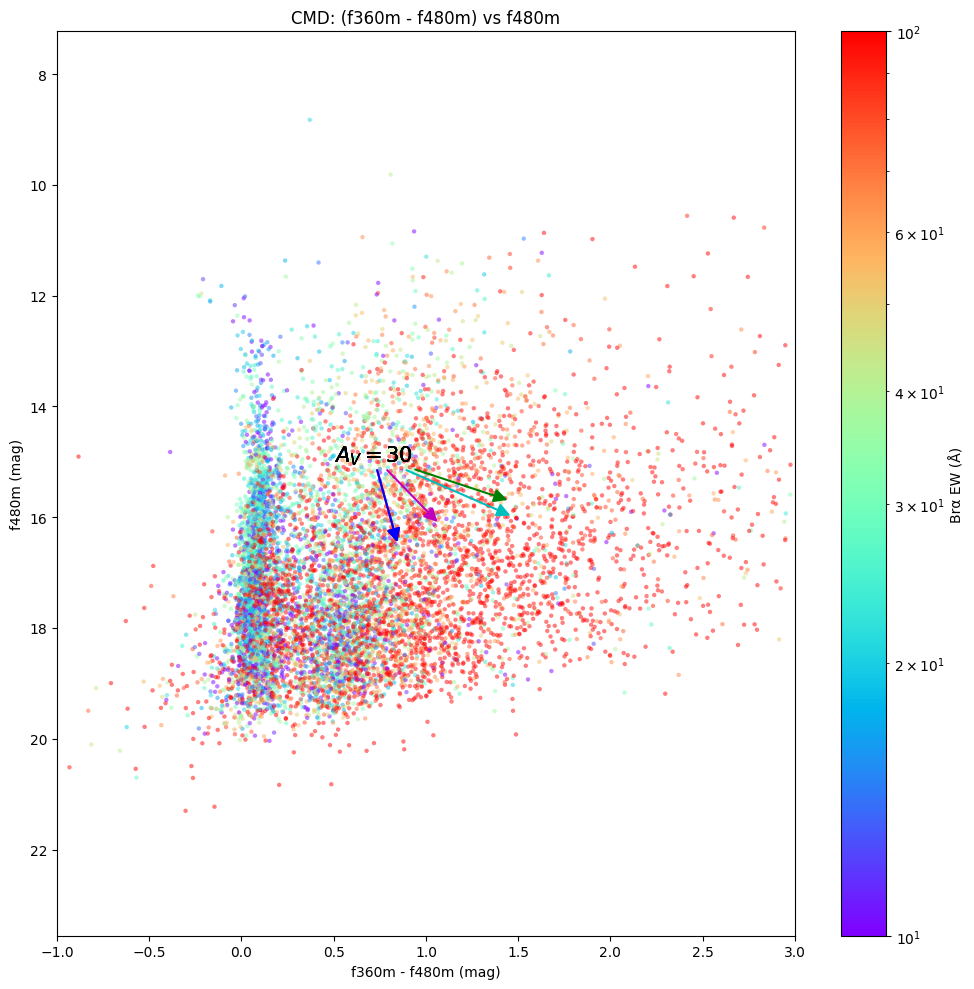

In [6]:
# same cmd with Bra EW
color_for_points = bra_excess_ew
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
cmap = plt.get_cmap('rainbow')
norm = LogNorm(vmin=10, vmax=100)
ax.scatter(color1.value, mag1.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none',norm=norm)
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('f480m (mag)')
ax.set_title(f'CMD: (f360m - f480m) vs f480m')
ax.invert_yaxis()  # Invert y-axis for magnitude
from dust_extinction.averages import RL85_MWGC, CT06_MWLoc, G21_MWAvg,RRP89_MWGC, G24_SMCAvg
colorlist = ['r', 'g', 'b', 'm', 'c', 'y']  
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    plot_extvec_cmd(ax, color1=('f360m', 'f480m'), mag1=('f480m',), 
                     ext=ext_model, extvec_scale=30, color=c, 
                     color1_data=color, mag1_data=magnitude, start=(0.5, 15), label=labels)
#add colorbar for the color coding
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Brα EW (Å)')
ax.set_xlim(-1, 3)
plt.tight_layout()

Model: CT06_MWLoc
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 1.62 um 3.6 um 4.8 um
1.4 um 1.62 um 3.6 um 4.8 um
7.129363200000001 5.382330074074073 1.7993024000000004 1.454796
Model: RL85_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 1.62 um 3.6 um 4.8 um
1.4 um 1.62 um 3.6 um 4.8 um
7.0412946428571415 5.4357638888888875 1.6323076923076927 0.69
Model: CT06_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 1.62 um 3.6 um 4.8 um
1.4 um 1.62 um 3.6 um 4.8 um
7.129363200000001 5.382330074074073 1.7993024000000004 1.454796
Model: G21_MWAvg
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 1.62 um 3.6 um 4.8 um
1.4 um 1.62 um 3.6 um 4.8 um
6.673350218462829 5.377005929042962 1.6526084768147404 1.0894231111576114
Model: RRP89_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 1.62 um 3.6 um 4.8 um
1.4 um 1.62 um 3.6 um 4.8 um
6.877352882900731 5.15745734947461 1.9293004729897925 

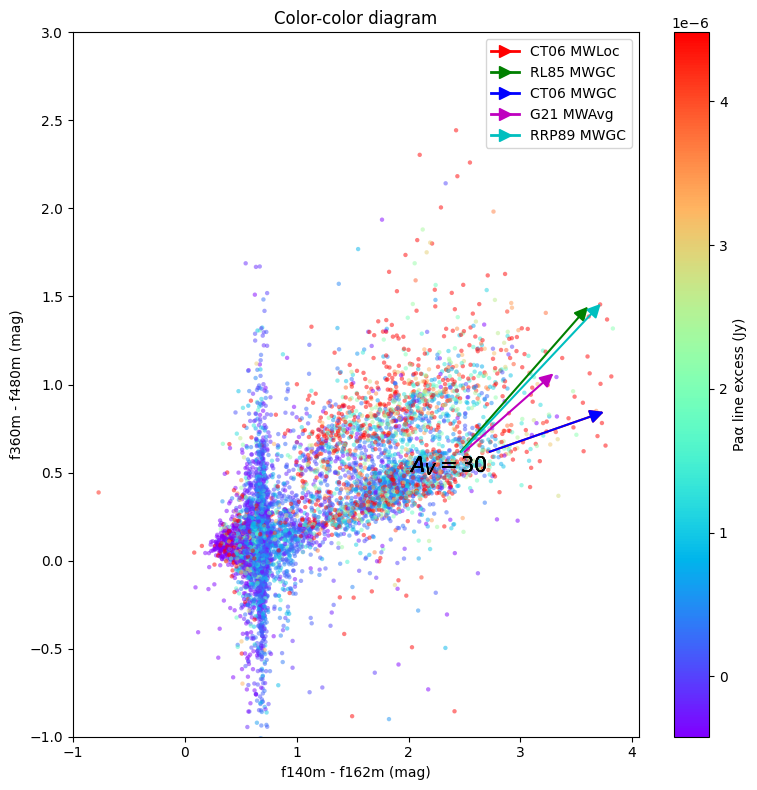

In [7]:

def plot_extvec_ccd(ax, color1, color2, ext=RL85_MWGC(), extvec_scale=30, start=None,
                    color='y', head_width=0.5, color1_data=None, color2_data=None, label=None, fontsize=15):
    def get_wave(c):
        if c == '410m405': return 4.10*u.um
        if c == '405m410': return 4.05*u.um
        if c == 'Hmag': return 1.634*u.um
        if c == 'Ksmag': return 2.143527*u.um
        return int(c[1:-1])/100*u.um

    w1 = get_wave(color1[0])
    w2 = get_wave(color1[1])
    w3 = get_wave(color2[0])
    w4 = get_wave(color2[1])

    if w1 > w2:
        w1, w2 = w2, w1
        color1 = color1[::-1]
    if w3 > w4:
        w3, w4 = w4, w3
        color2 = color2[::-1]
    print(w1,w2,w3,w4)

    # Only plot if all are in valid range
    try:
        e_1 = ext(1/w1) * extvec_scale
        e_2 = ext(1/w2) * extvec_scale
        e_3 = ext(1/w3) * extvec_scale
        e_4 = ext(1/w4) * extvec_scale
    except ValueError as e:
        print(f"Extinction vector not plotted: {e}")
        return
    print(w1,w2,w3,w4)
    print(e_1, e_2, e_3, e_4)
    if start == None:
        mean_color1 = np.nanmean(color1_data)
        mean_color2 = np.nanmean(color2_data)
        std_color1 = np.nanstd(color1_data)
        std_color2 = np.nanstd(color2_data)
        if e_1 - e_2 < 0:
            std_color1 *= -1
        if e_3 - e_4 < 0:
            std_color2 *= -1
    
        start2 = (mean_color1 + 2*std_color1, mean_color2 + 2*std_color2)
    else:
        start2 = start

    ax.annotate(f'$A_V={extvec_scale}$', xy=(start2[0] + (e_1 - e_2), start2[1] + (e_3 - e_4)),
                xytext=(start2[0], start2[1]), fontsize=fontsize,
                arrowprops=dict(arrowstyle='-|>', color=color,
                                shrinkA=0, shrinkB=0,
                                mutation_scale=20, linewidth=1.5))
    
    if label is not None:
        ax.plot([], [], color=color, marker='>', markersize=8,
                label=f'{label}', linestyle='-', linewidth=2)

    else:
        ax.plot([], [], color=color, marker='>', markersize=8,
                linestyle='-', linewidth=2)


# 140-162 vs 360-480 color coded by paa excess
color1 = filters['f140m'][0] - filters['f162m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
color_for_points = paa_excess


fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
cmap = plt.get_cmap('rainbow')
norm = plt.Normalize(vmin=np.nanpercentile(color_for_points, 10), vmax=np.nanpercentile(color_for_points, 90))
ax.scatter(color1.value, color2.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none', norm=norm)
ax.set_xlabel('f140m - f162m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('Color-color diagram')
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
cbar.set_label('Paα line excess (Jy)')
ax.set_ylim(-1,3)

colorlist = ['r', 'g', 'b', 'm', 'c', 'y']
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    print(ext_model)
    plot_extvec_ccd(ax, color1=('f140m', 'f162m'), color2=('f360m', 'f480m'),
                     ext=ext_model, extvec_scale=30, color=c,
                     color1_data=color1, color2_data=color2, start=(2,0.5), label=labels)


ax.legend()
plt.tight_layout()
plt.show()


 col1    col2    col3       col4          col5       col6   col7   col8   col9 col10 col11 col12  col13 col14 col15 col16 col17 col18   col19   col20  col21   col22    col23     col24     col25   col26   col27   col28  col29  col30  col31  col32  col33  col34  col35  col36  col37  col38  col39  col40  col41  col42  col43  col44  col45  col46  col47  col48  col49  col50 
------ ------- ------- -------------- ------------ ------- ------ ------ ----- ----- ----- ------ ----- ----- ----- ----- ----- ----- --------- ----- -------- ------ --------- --------- --------- ------ ------- ------- ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------
0.0207 0.15867     6.0   0.0908484459 1.0897678296   0.091  -1.33 3.4326 3.409     0   0.0  0.545   0.0   0.0   0.0   0.0   0.0    -1 -3.89e-14   0.0   0.6936 0.2855  0.003749  0.001011  0.009172   -1.0 0.02085   8.095  9.712  7.478  6.249  5.749  5.324 

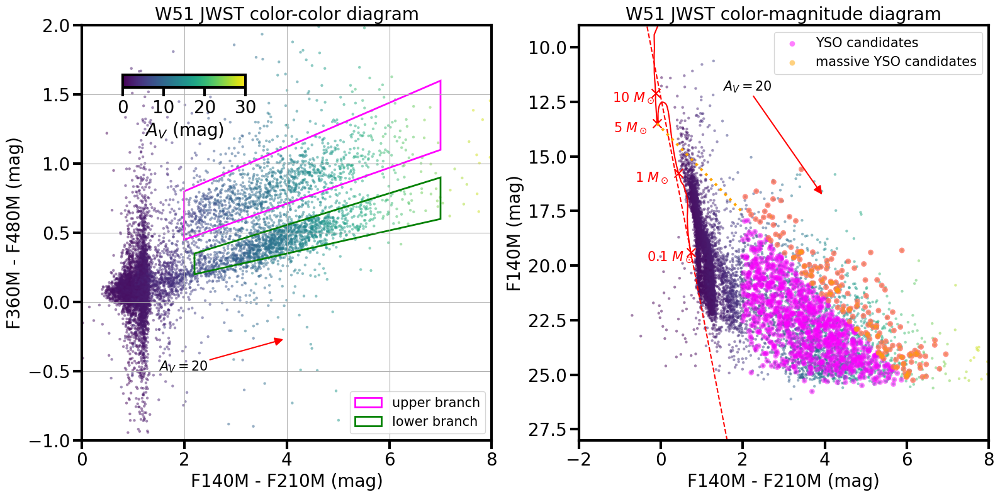

In [8]:
ext = CT06_MWLoc()
import matplotlib as mpl
from matplotlib.path import Path

plt.rcParams['axes.labelsize']=20 
plt.rcParams['xtick.labelsize']=20
plt.rcParams['ytick.labelsize']=20
plt.rcParams['axes.titlesize']=20
mpl.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.major.size'] = 10
plt.rcParams['xtick.major.width'] = 3
plt.rcParams['ytick.major.size'] = 10
plt.rcParams['ytick.major.width'] = 3
# plot two subaxes, the one F140M-F210M vs F360M-F480M, color coded by A_V from SED fitting, and the other F140M vs F140M-F210M coded by A_V and also plotting isochorne on top of it.
# plot only one dust extinction vertor from CT06 MWLoc for now, since the plot is getting too busy with all the extinction vectors. We can add more later if needed.


from matplotlib.patches import Polygon  

from astropy.table import Table
import crds
parsec_av0 = Table.read('/home/t.yoo/parsec_av0.txt', format='ascii')
parsec_av0.pprint(max_width=-1, max_lines=-1)   
m_init = parsec_av0['col4']  
parsec_av0 = parsec_av0[m_init<300]              
logage_av0 = parsec_av0['col3']
mass_av0 = parsec_av0['col6']
print(np.min(m_init), np.max(m_init))
print(np.min(mass_av0), np.max(mass_av0))
F140Mmag_av0 = parsec_av0['col39'] + 5*np.log10(5400)-5
F162Mmag_av0 = parsec_av0['col40']+ 5*np.log10(5400)-5
F182Mmag_av0 = parsec_av0['col41']+ 5*np.log10(5400)-5
F210Mmag_av0 = parsec_av0['col42']+ 5*np.log10(5400)-5
F335Mmag_av0 = parsec_av0['col45']+ 5*np.log10(5400)-5
F360Mmag_av0 = parsec_av0['col46']+ 5*np.log10(5400)-5
F410Mmag_av0 = parsec_av0['col47']+ 5*np.log10(5400)-5
F480Mmag_av0 = parsec_av0['col50']+ 5*np.log10(5400)-5

parsec_av10 = Table.read('/home/t.yoo/parsec_av10.txt', format='ascii')
logage_av10 = parsec_av10['col3']
mass_av10 = parsec_av10['col6']
F140Mmag_av10 = parsec_av10['col39']+ 5*np.log10(5400)-5
F162Mmag_av10 = parsec_av10['col40']+ 5*np.log10(5400)-5
F182Mmag_av10 = parsec_av10['col41']+ 5*np.log10(5400)-5
F210Mmag_av10 = parsec_av10['col42']+ 5*np.log10(5400)-5
F335Mmag_av10 = parsec_av10['col45']+ 5*np.log10(5400)-5
F360Mmag_av10 = parsec_av10['col46']+ 5*np.log10(5400)-5
F410Mmag_av10 = parsec_av10['col47']+ 5*np.log10(5400)-5
F480Mmag_av10 = parsec_av10['col50']+ 5*np.log10(5400)-5
age_idx = logage_av0 == 6
idx_01msun = np.argmin(np.abs(mass_av0[age_idx]-0.1))
idx_20msun = np.argmin(np.abs(mass_av0[age_idx]-20))
print(F140Mmag_av0)
print('age_idx:', age_idx, 'idx_01msun:', idx_01msun, 'idx_20msun:', idx_20msun)
isochrone_x_start = F140Mmag_av0[age_idx][idx_01msun] - F210Mmag_av0[age_idx][idx_01msun]
isochrone_x_end = F140Mmag_av0[age_idx][idx_20msun] - F210Mmag_av0[age_idx][idx_20msun]
isocrhone_y_start = F140Mmag_av0[age_idx][idx_01msun]
isocrhone_y_end = F140Mmag_av0[age_idx][idx_20msun]
color_slope = (isocrhone_y_end - isocrhone_y_start) / (isochrone_x_end - isochrone_x_start)
color_intercept = isocrhone_y_start - color_slope * isochrone_x_start


fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)



color1 = filters['f140m'][0] - filters['f210m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]

def get_av(color, mag, ext=RL85_MWGC(), color1=('f140m', 'f162m'), mag1=('f140m',), isochrone_line_params=(color_slope, color_intercept)):
    # Get the slope and intercept of the isochrone line
    m_iso, b_iso = isochrone_line_params

    # Get the extinction vector components
    w_color1_1 = int(color1[0][1:-1])/100*u.um
    w_color1_2 = int(color1[1][1:-1])/100*u.um
    w_mag1 = int(mag1[0][1:-1])/100*u.um
    print('w_color1_1:', w_color1_1, 'w_color1_2:', w_color1_2, 'w_mag1:', w_mag1)

    e_color1_1 = ext(1/w_color1_1)
    e_color1_2 = ext(1/w_color1_2)
    e_mag1 = ext(1/w_mag1)

    # get the contact to the isochrone line along the extinction vector
    # the extinction vector can be represented as a line with slope m_ext = e_mag1 / (e_color1_1 - e_color1_2) and passing through the point (color, mag)
    m_ext = e_mag1 / (e_color1_1 - e_color1_2)
    b_ext = mag - m_ext * color

    # find the intersection of the isochrone line and the extinction vector
    x_int = (b_ext - b_iso) / (m_iso - m_ext)
    y_int = m_iso * x_int + b_iso

    # calculate A_V as the distance from (color, mag) to (x_int, y_int) along the extinction vector
    av = (mag - y_int) / ext(1/w_mag1)
    av[av < 0] = 0
    return av


color_for_points = get_av(
    color1.value,  # Remove units
    mag1.value,    # Remove units
    ext=CT06_MWLoc(),
    color1=('f140m', 'f210m'),
    mag1=('f140m',),
    isochrone_line_params=(color_slope, color_intercept)
)

ax1.scatter(color1.value, color2.value, s=10, c=color_for_points, cmap='viridis', alpha=0.5, edgecolor='none')
ax1.set_xlabel('F140M - F210M (mag)')
ax1.set_ylabel('F360M - F480M (mag)')
ax1.set_title('W51 JWST color-color diagram')
plot_extvec_ccd(ax1, color1=('f140m', 'f210m'), color2=('f360m', 'f480m'), ext=CT06_MWLoc(), extvec_scale=20, color='r', color1_data=color1, color2_data=color2, start=(1.5,-0.5)) 





axins = ax1.inset_axes([0.1, 0.85, 0.3, 0.03])
norm = plt.Normalize(vmin=0, vmax=30)
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap='viridis'), cax=axins, orientation='horizontal')
cbar.set_label('$A_V$ (mag)')
cbar.set_ticks([0,10,20,30])
ax1.grid()
vertices_upper = [(2,0.45), (2,0.8), (7, 1.6), (7, 1.1)]
vertices_lower = [(2.2,0.2), (2.2,0.35 ), (7,0.9), (7, 0.6)]
polygon1 = Polygon(vertices_upper, closed=True, fill=False, edgecolor='magenta', linewidth=2, label='upper branch')
polygon2 = Polygon(vertices_lower, closed=True, fill=False, edgecolor='green', linewidth=2, label='lower branch')
ax1.add_patch(polygon1)
ax1.add_patch(polygon2)
path1 = Path(vertices_upper)
idx1 = path1.contains_points(np.array([color1.value, color2.value]).T)
#ax1.set_ylim(-1, 2.5)
#ax1.set_xlim(-0.5,3.5)
"""
ra_kang09 = [290.9033,  290.92963, 290.950565, 290.949425, 290.956121, 290.95945 ]
dec_kang09 = [14.52127,  14.48092, 14.4915651, 14.50051, 14.47373, 14.47451)




skycoord_kang09 = SkyCoord(ra=ra_kang09*u.deg, dec=dec_kang09*u.deg, frame='icrs')
idx_kang09, d2d_kang09, _ = skycoord_kang09.match_to_catalog_sky(catalog['skycoord_ref'], nthneighbor=1)
sep_lim = 0.2*u.arcsec
matched_kang09 = d2d_kang09 < sep_lim
ax1.scatter(color1.value[idx_kang09], color2.value[idx_kang09], s=50, edgecolor='cyan', facecolor='none', marker='o', label='YSOs from Kang+09')
"""
#path2 = Path(vertices_lower)
#idx2 = path2.contains_points(np.array([color1.value, color2.value]).T)
ax1.legend(fontsize=15)
ax1.set_ylim(-1,2)
ax1.set_xlim(0,8)

mag1 = filters['f140m'][0]
color1 = filters['f140m'][0] - filters['f210m'][0]

ax2.scatter(color1.value, mag1.value, s=10, c=color_for_points, cmap='viridis', alpha=0.5, edgecolor='none')
ax2.scatter(color1.value[idx1], mag1.value[idx1], s=40, c='magenta', alpha=0.5, edgecolor='none', label='YSO candidates')
ax2.set_xlabel('F140M - F210M (mag)')
ax2.set_ylabel('F140M (mag)')
ax2.set_title('W51 JWST color-magnitude diagram')
plot_extvec_cmd(ax2, color1=('f140m', 'f210m'), mag1=('f140m',), ext=CT06_MWLoc(), extvec_scale=20, color='r', color1_data=color1, mag1_data=mag1, start=(1.5,12))

ge_idx = logage_av0 == 6

ax2.plot(F140Mmag_av0[age_idx] - F210Mmag_av0[age_idx], F140Mmag_av0[age_idx], color='r')


A_K_scale = 5
A_V_scale = A_K_scale * 10
#ax.plot([isochrone_x_start, isochrone_x_end], [isocrhone_y_start, isocrhone_y_end], color='r', linestyle='--')
#ax1.plot([isochrone_x_start+(ext(1/1.82/u.um)-ext(1/2.10/u.um))*A_V_scale, isochrone_x_end+(ext(1/1.82/u.um)-ext(1/2.10/u.um))*A_V_scale], 
#[isocrhone_y_start+(ext(1/1.82/u.um))*A_V_scale, isocrhone_y_end+(ext(1/1.82/u.um))*A_V_scale], color='r', linestyle='--')
# extrapolate the linear part of the isochrone to the left and right by 0.5 mag in color

# and plot
x_vals = np.array([-1, 2])
y_vals = color_slope * x_vals + color_intercept
ax2.plot(x_vals, y_vals, color='r', linestyle='--')
for mass in [0.1, 1, 5, 10]:
    idx_mass = np.argmin(np.abs(mass_av0[age_idx]-mass))
    ax2.scatter(F140Mmag_av0[age_idx][idx_mass] - F210Mmag_av0[age_idx][idx_mass], F140Mmag_av0[age_idx][idx_mass], color='r', marker='x', s=100)
    ax2.annotate(f'{mass} $M_\odot$', (F140Mmag_av0[age_idx][idx_mass] - F210Mmag_av0[age_idx][idx_mass], F140Mmag_av0[age_idx][idx_mass]), textcoords="offset points", xytext=(-50,-10), ha='left', color='r', fontsize=15)
ax2.set_xlim(-2, 8)
ax2.set_ylim(28, 9)
ax2.legend(fontsize=15)
#plot extended line from 5Msun isochrone point following dust extinction vector and get the index of sources above this line
isochrone_5msun_color = F140Mmag_av0[age_idx][np.argmin(np.abs(mass_av0[age_idx]-5))] - F210Mmag_av0[age_idx][np.argmin(np.abs(mass_av0[age_idx]-5))]
isochrone_5msun_mag = F140Mmag_av0[age_idx][np.argmin(np.abs(mass_av0[age_idx]-5))]
ext_color = ext(1/1.4/u.um) - ext(1/2.10/u.um)
ext_mag = ext(1/1.4/u.um)
slope_ext = ext_mag / ext_color
intercept_ext = isochrone_5msun_mag - slope_ext * isochrone_5msun_color
x_ext = np.array([-1, 2])
y_ext = slope_ext * x_ext + intercept_ext
#ax2.plot(x_ext, y_ext, color='magenta', linestyle='--', label='Extinction vector from 5 Msun isochrone point')
# get the index of sources above this line and also sources in idx1
idx_ext = (np.array(mag1.value) < slope_ext * np.array(color1.value) + intercept_ext) & idx1
ax2.scatter(color1.value[idx_ext], mag1.value[idx_ext], s=40, c='orange', alpha=0.5, edgecolor='none', label='massive YSO candidates')
idx_5msun = np.argmin(np.abs(mass_av0[age_idx]-5))
ax2.plot([F140Mmag_av0[age_idx][idx_5msun] - F210Mmag_av0[age_idx][idx_5msun], 2], [F140Mmag_av0[age_idx][idx_5msun],F140Mmag_av0[age_idx][idx_5msun]+ slope_ext * (2 - (F140Mmag_av0[age_idx][idx_5msun] - F210Mmag_av0[age_idx][idx_5msun]))], color='orange', ls='dotted', lw=3)
ax2.legend(fontsize=15)
plt.tight_layout()
plt.show()


Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


19:23:40.3506 14:31:02.316
19:23:38.1654 14:30:43.526
19:23:40.3726 14:31:20.216
19:23:41.4986 14:31:09.783
19:23:42.2330 14:30:48.446
19:23:43.4049 14:30:51.747
19:23:42.9441 14:30:33.545
19:23:43.5849 14:30:14.247
19:23:44.0713 14:30:33.887
19:23:44.6259 14:30:15.395
19:23:40.8460 14:31:34.152
19:23:39.2033 14:30:54.361
19:23:38.9058 14:30:34.784
19:23:39.4394 14:31:09.100
19:23:44.7828 14:29:57.408
19:23:42.1322 14:30:11.622
19:23:41.5021 14:30:26.771
17 17
      RA          Dec      Coordinate_type Coordinate_units
------------- ------------ --------------- ----------------
290.918127453 14.517309933        Absolute          Degrees
290.909022517 14.512090625        Absolute          Degrees
290.918219218 14.522282121        Absolute          Degrees
290.922910803 14.519384301        Absolute          Degrees
290.925970767 14.513457341        Absolute          Degrees
290.930853849  14.51437425        Absolute          Degrees
290.928933679  14.50931797        Absolute          Deg

/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/regions/shapes/circle.py:160: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  return Circle(xy=xy, radius=radius, **mpl_kwargs)
/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/regions/shapes/ellipse.py:209: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  return Ellipse(xy=xy, width=width, height=height, angle=angle,


Number of sources in the candidate region: 107 among 181 total sources
(array(419.21171971), array(2160.85297469)) (630, 2250)


Text(729.1470774484292, 1939.2117536986848, 'East')

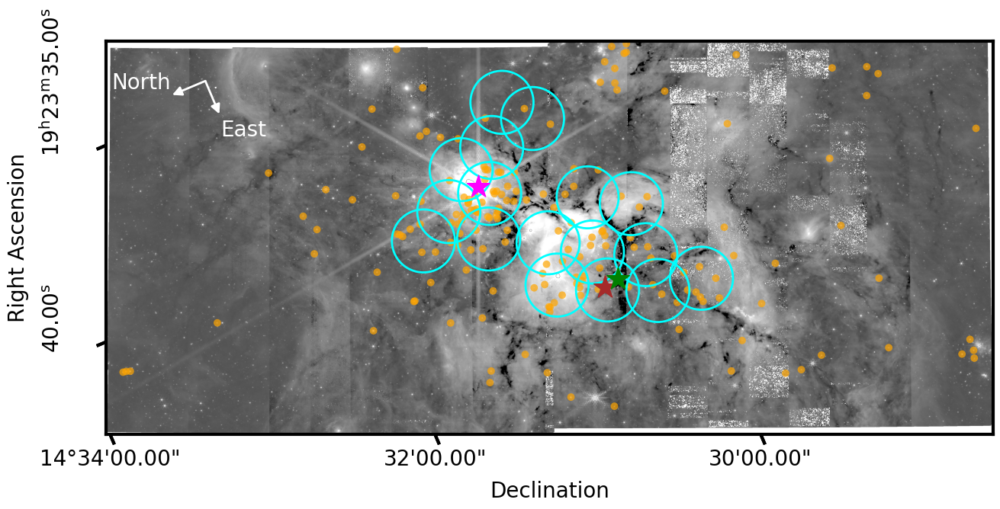

In [9]:
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
from regions import Regions
from astropy.visualization import simple_norm
# plot spatial distribution of massive YSO candidates in F480M image
reg_targets = Regions.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/alma_cycle13_outflow_proposals_target_new.reg', format='ds9')
image_f480m = fits.getdata(image_filenames['f480m'], ext=('SCI', 1))
hdr_f480m = fits.getheader(image_filenames['f480m'], ext=('SCI', 1))
wcs_f480m = WCS(hdr_f480m)
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection=wcs_f480m)
norm = simple_norm(image_f480m, stretch='log', percent=99)
ax.imshow(image_f480m, origin='lower', cmap='gray', norm=norm)
skycoord_all = catalog['skycoord_ref']
skycoord_candidates = catalog['skycoord_ref'][idx_ext]
pixcoord_all = skycoord_all.to_pixel(wcs_f480m)
pixcoord_candidates = skycoord_candidates.to_pixel(wcs_f480m)
ax.scatter(pixcoord_candidates[0], pixcoord_candidates[1], s=50, c='orange', alpha=0.7, edgecolor='none', label='All sources')
#save skycoord_candidates in fits

t = Table()
t['ra_deg'] = skycoord_candidates.ra.deg
t['dec_deg'] = skycoord_candidates.dec.deg
t.write('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/massive_yso_candidates_coordinates.fits',
        format='fits', overwrite=True)

ax.set_xlabel('Right Ascension')
ax.set_ylabel('Declination')
# save skycoord in hh:mm:ss and dd:mm:ss for each region as csv
table_to_write = Table()
ra_list = []
dec_list = []
for reg in reg_targets:
    #print skycoord in hh:mm:ss and dd:mm:ss without h m s and d m s symbols, and also save them in degrees in the table to write
    skycoord_reg = reg.center
    print(f'{skycoord_reg.ra.to_string(unit=u.hour, sep=":", precision=4)} {skycoord_reg.dec.to_string(unit=u.deg, sep=":", precision=3)}')
    pix_reg = reg.to_pixel(wcs_f480m)
    pix_reg.plot(ax=ax, color='cyan', lw=2)
    ra_list.append(skycoord_reg.ra.deg)
    dec_list.append(skycoord_reg.dec.deg)
table_to_write['RA'] = ra_list
table_to_write['Dec'] = dec_list
print(len(ra_list), len(dec_list))
table_to_write['Coordinate_type'] = ['Absolute']*len(ra_list)
table_to_write['Coordinate_units'] = ['Degrees']*len(ra_list)
table_to_write.write('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/alma_cycle13_outflow_proposals_target_skycoord.csv', format='csv', overwrite=True)
print(table_to_write)
reg_alma = Regions.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/massive_protostars_alma.reg', format='ds9')
color_for_alma = ['magenta', 'brown', 'green']
for ii, reg in enumerate(reg_alma):
    skycoord_reg = reg.center
    pixcoord_reg = skycoord_reg.to_pixel(wcs_f480m)
    ax.scatter(pixcoord_reg[0], pixcoord_reg[1], s=500, facecolor=color_for_alma[ii],  marker='*', label='ALMA massive protostars')
co_disk_skycoord = SkyCoord(ra='19 23 41.97', dec='+14 30 36.8', unit=(u.hourangle, u.deg))
co_disk_pixcoord = co_disk_skycoord.to_pixel(wcs_f480m)
#ax.scatter(co_disk_pixcoord[0], co_disk_pixcoord[1], s=500, edgecolor='blue', facecolor='none', marker='*', label='ALMA CO disk')

ra = lon = ax.coords['ra']
dec = lat = ax.coords['dec']
ra.set_major_formatter('hh:mm:ss.ss')
dec.set_major_formatter('dd:mm:ss.ss')
ra.set_axislabel('Right Ascension')
ra.set_ticklabel(rotation=90, pad=30)
dec.set_axislabel('Declination')

ra.set_ticks_position('l')
ra.set_ticklabel_position('l')
ra.set_axislabel_position('l')
dec.set_ticks_position('b')
dec.set_ticklabel_position('b')
dec.set_axislabel_position('b')

# count the number of high mass YSO candidates contained in any of the regions in reg_targets
is_contained = np.zeros(len(idx_ext), dtype=bool)
skycoord_candidates = catalog['skycoord_ref'][idx_ext]
is_contained_total = np.zeros(len(skycoord_candidates), dtype=bool)
for reg in reg_targets: 
    is_contained = reg.contains(skycoord_candidates, wcs=wcs_f480m)
    is_contained_total |= is_contained

print(f'Number of sources in the candidate region: {np.sum(is_contained_total)} among {len(catalog["skycoord_ref"][idx_ext])} total sources')

#plot arrows directing north and east in the icrs system

arrow_start_pixel = (630, 2250)  # (x, y) in pixels

# Compute a point 0.002 degrees north in sky coords
sky_coord_start = wcs_f480m.pixel_to_world(*arrow_start_pixel)
sky_coord_north = sky_coord_start.spherical_offsets_by(0*u.deg, 0.004*u.deg)  # 0.002 deg north

# Convert back to pixel coordinates
arrow_end_pixel = wcs_f480m.world_to_pixel(sky_coord_north)

# Draw arrow
print(arrow_end_pixel, arrow_start_pixel)
ax.annotate(
    '',
    xy=arrow_end_pixel,
    xytext=arrow_start_pixel,
    xycoords='data',
    arrowprops=dict(
        arrowstyle='-|>',   # arrow head
        color='white',
        lw=2,
        mutation_scale=18,  # head size
        shrinkA=0,
        shrinkB=0
    )
)

# Label "North"
ax.text(
    arrow_end_pixel[0] - 200 , arrow_end_pixel[1] + 10, 'North',
    color='white', fontsize=20, ha='center', va='bottom'
)

# compute a point 0.002 degrees east in sky coords
sky_coord_east = sky_coord_start.spherical_offsets_by(0.004*u.deg, 0*u.deg)  # 0.002 deg east
arrow_end_east_pixel = wcs_f480m.world_to_pixel(sky_coord_east)
# Draw east arrow\
"""
ax.annotate(
    '', xy=arrow_end_east_pixel, xytext=arrow_start_pixel,
    arrowprops=dict( color='white', width=2,headwidth=6, frac=0.05, ec='w', fc='w'),
    xycoords='data'
)
"""
ax.annotate(
    '',
    xy=arrow_end_east_pixel,
    xytext=arrow_start_pixel,
    xycoords='data',
    arrowprops=dict(
        arrowstyle='-|>',   # arrow head
        color='white',
        lw=2,
        mutation_scale=18,  # head size
        shrinkA=0,
        shrinkB=0
    )
)
# Label "East"
ax.text(
    arrow_end_east_pixel[0] + 10, arrow_end_east_pixel[1] - 100, 'East',
    color='white', fontsize=20, ha='left', va='center'
)
#cat_to_sav = catalog[idx_ext]
#cat_to_sav.write('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/alma_high_yso_candidates.fits', format='fits', overwrite=True)

w_color1_1: 2.1 um w_color1_2: 3.6 um w_mag1: 2.1 um
2.1 um 3.6 um 2.1 um
2.1 um 3.6 um 2.1 um
2.3159807999999997 1.1995349333333336 2.3159807999999997


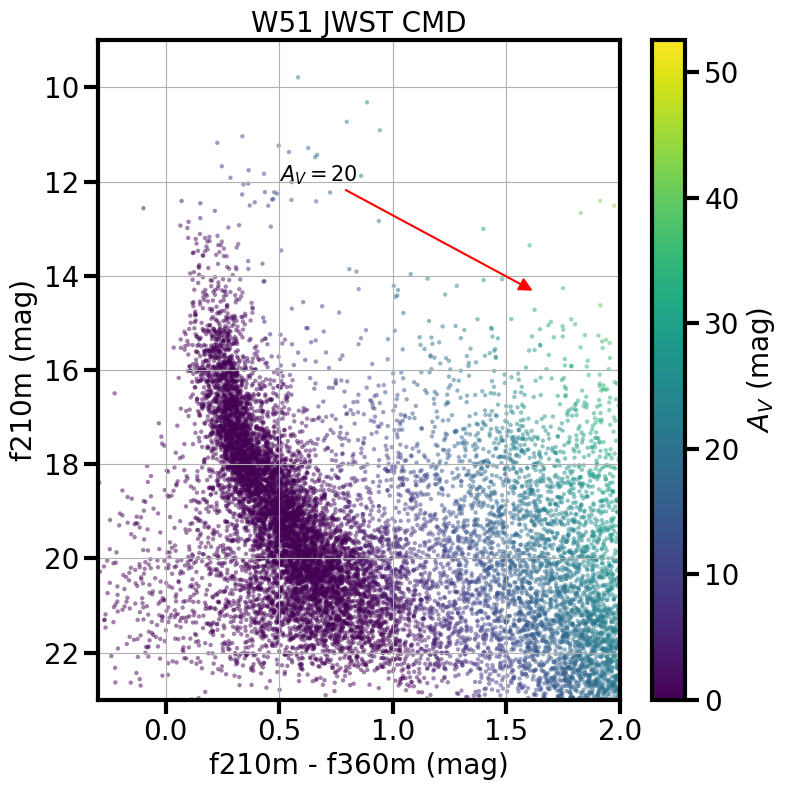

In [10]:
# 210 vs 210-360, color coded by Av
color1 = filters['f210m'][0] - filters['f360m'][0]
mag1 = filters['f210m'][0]
color_for_points = get_av(
    color1.value,  # Remove units
    mag1.value,    # Remove units
    ext=CT06_MWLoc(),
    color1=('f210m', 'f360m'),
    mag1=('f210m',),
    isochrone_line_params=(color_slope, color_intercept)
)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
cmap = plt.get_cmap('viridis')
norm = plt.Normalize(vmin=np.nanpercentile(color_for_points, 10), vmax=np.nanpercentile(color_for_points, 90))
ax.scatter(color1.value, mag1.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none', norm=norm)
ax.set_xlabel('f210m - f360m (mag)')
ax.set_ylabel('f210m (mag)')
ax.set_title('W51 JWST CMD')
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
cbar.set_label('$A_V$ (mag)')
plot_extvec_cmd(ax, color1=('f210m', 'f360m'), mag1=('f210m',), ext=CT06_MWLoc(), extvec_scale=20, color='r', color1_data=color1, mag1_data=mag1, start=(0.5,12)) 
ax.set_xlim(-0.3, 2)
ax.set_ylim(23, 9)
ax.grid()
plt.tight_layout()
plt.show()

w_color1_1: 3.6 um w_color1_2: 4.8 um w_mag1: 3.6 um
3.6 um 4.8 um 3.6 um
3.6 um 4.8 um 3.6 um
1.1995349333333336 0.9698640000000001 1.1995349333333336


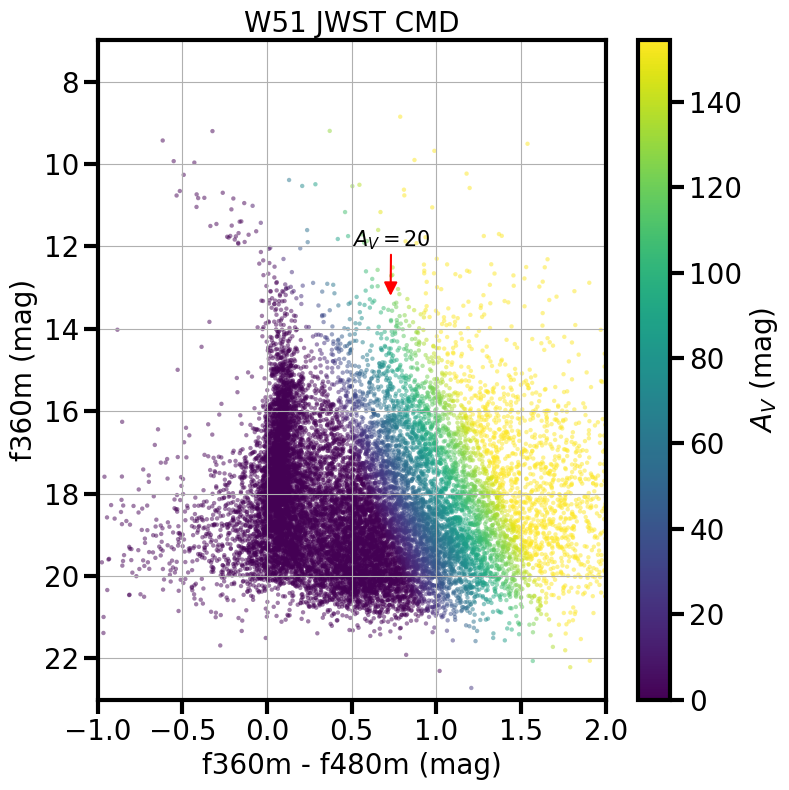

In [11]:
# 360 vs 360-480, color coded by Av
color1 = filters['f360m'][0] - filters['f480m'][0]
mag1 = filters['f360m'][0]
color_for_points = get_av(
    color1.value,  # Remove units
    mag1.value,    # Remove units
    ext=CT06_MWLoc(),
    color1=('f360m', 'f480m'),
    mag1=('f360m',),
    isochrone_line_params=(color_slope, color_intercept)
)
fig = plt.figure(figsize=(8, 8))    
ax = fig.add_subplot(111)
cmap = plt.get_cmap('viridis')
norm = plt.Normalize(vmin=np.nanpercentile(color_for_points, 10), vmax=np.nanpercentile(color_for_points, 90))
ax.scatter(color1.value, mag1.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none', norm=norm)
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('f360m (mag)')
ax.set_title('W51 JWST CMD')
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
cbar.set_label('$A_V$ (mag)')
plot_extvec_cmd(ax, color1=('f360m', 'f480m'), mag1=('f360m',), ext=CT06_MWLoc(), extvec_scale=20   , color='r', color1_data=color1, mag1_data=mag1, start=(0.5,12))
ax.set_xlim(-1, 2)
ax.set_ylim(23, 7)
ax.grid()
plt.tight_layout()
plt.show()

Model: CT06_MWLoc
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
7.129363200000001 3.4739712 1.7993024000000004 1.454796
Model: RL85_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
7.0412946428571415 3.6726315789473687 1.6323076923076927 0.69
Model: CT06_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
7.129363200000001 3.4739712 1.7993024000000004 1.454796
Model: G21_MWAvg
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
6.673350218462829 3.662529750810622 1.6526084768147404 1.0894231111576114
Model: RRP89_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
6.877352882900731 3.598397287717673 1.9293004729897925 0.9708737864077621
Model:

/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/dust_extinction/helpers.py:12: SpectralUnitsWarning: x has no units, assuming x units are inverse microns
  warnings.warn(


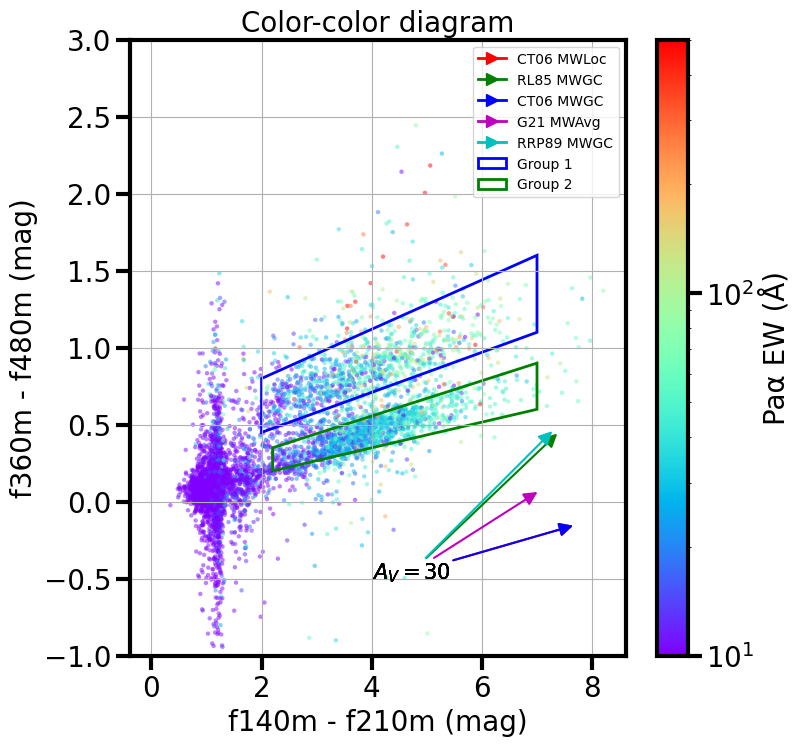

In [12]:
from matplotlib.path import Path
from matplotlib.patches import Polygon  
#color color diagram (F140M-F210M vs F360M-F480M) colored by PaA EW
color1 = filters['f140m'][0] - filters['f210m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
color_for_points = paa_excess_ew
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
cmap = plt.get_cmap('rainbow')
norm = LogNorm(vmin=10, vmax=5e2)
ax.scatter(color1.value, color2.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none', norm=norm)
ax.set_xlabel('f140m - f210m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('Color-color diagram')
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
cbar.set_label('Paα EW (Å)')
ax.set_ylim(-1,3)
colorlist = ['r', 'g', 'b', 'm', 'c', 'y']
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    print(ext_model)
    plot_extvec_ccd(ax, color1=('f140m', 'f210m'), color2=('f360m', 'f480m'),
                     ext=ext_model, extvec_scale=30, color=c,
                     color1_data=color1, color2_data=color2, start=(4,-0.5), label=labels)   

vertices_upper = [(2,0.45), (2,0.8), (7, 1.6), (7, 1.1)]
vertices_lower = [(2.2,0.2), (2.2,0.35 ), (7,0.9), (7, 0.6)]
polygon1 = Polygon(vertices_upper, closed=True, fill=False, edgecolor='blue', linewidth=2, label='Group 1')
polygon2 = Polygon(vertices_lower, closed=True, fill=False, edgecolor='green', linewidth=2, label='Group 2')
ax.add_patch(polygon1)
ax.add_patch(polygon2)
path1 = Path(vertices_upper)
idx1 = path1.contains_points(np.array([color1.value, color2.value]).T)

path2 = Path(vertices_lower)
idx2 = path2.contains_points(np.array([color1.value, color2.value]).T)
ax.legend()
ax.grid()



In [13]:
import pandas as pd
from seshat_classifier import seshat

refined_catalog = pd.DataFrame({
    'f140m': f140m_mag[0],
    'f162m': f162m_mag[0],
    'f182m': f182m_mag[0],
    'f210m': f210m_mag[0],
    'f335m': f335m_mag[0],
    'f360m': f360m_mag[0],
    'f410m': f410m_mag[0],
    'f480m': f480m_mag[0],
    'f560w': f560w_mag[0],
    'f770w': f770w_mag[0],
    'f1000w': f1000w_mag[0],
    'f1280w': f1280w_mag[0],
    'f2100w': f2100w_mag[0],
    'e_f140m': f140m_mag[1],
    'e_f162m': f162m_mag[1],
    'e_f182m': f182m_mag[1],
    'e_f210m': f210m_mag[1],
    'e_f335m': f335m_mag[1],
    'e_f360m': f360m_mag[1],
    'e_f410m': f410m_mag[1],
    'e_f480m': f480m_mag[1],
    'e_f560w': f560w_mag[1],
    'e_f770w': f770w_mag[1],
    'e_f1000w': f1000w_mag[1],
    'e_f1280w': f1280w_mag[1],
    'e_f2100w': f2100w_mag[1],
})

refined_catalog_upper = refined_catalog[idx1]
refined_catalog_lower = refined_catalog[idx2]



In [14]:
# Specify classes to be identified
classes = ['YSO', 'FS', 'Gal']

# Get classifications
my_catalog_classified_upper = seshat.classify(real = refined_catalog_upper, classes = classes, cosmological = False, return_test=False, threads = 1)


In [15]:
my_catalog_classified_upper

,f140m,f162m,f182m,f210m,f335m,f360m,f410m,f480m,f560w,f770w,...,e_f480m,e_f560w,e_f770w,e_f1000w,e_f1280w,e_f2100w,Predicted_Class,Prob YSO,Prob FS,Prob Gal
52,24.124010,22.632060,21.524180,20.490072,17.994384,17.655141,17.181802,16.624090,NaN,NaN,...,0.017482,NaN,NaN,NaN,NaN,NaN,YSO,0.978623,0.010619,0.010758
72,22.213711,20.391599,19.675428,18.868078,17.415413,16.983306,16.619213,16.288816,NaN,NaN,...,0.017521,NaN,NaN,NaN,NaN,NaN,YSO,0.966800,0.011445,0.021754
153,21.469974,20.183316,19.625386,19.003990,17.679713,17.443800,17.155115,16.799401,NaN,NaN,...,0.009544,NaN,NaN,NaN,NaN,NaN,Gal,0.144320,0.016864,0.838817
216,20.564723,19.141092,18.405974,17.746529,16.296545,16.032767,15.744289,15.399857,NaN,NaN,...,0.005297,NaN,NaN,NaN,NaN,NaN,YSO,0.597736,0.015221,0.387043
242,24.153345,21.901769,20.798074,19.746032,17.790587,17.374231,16.952656,16.528561,NaN,NaN,...,0.010921,NaN,NaN,NaN,NaN,NaN,YSO,0.975555,0.011300,0.013145
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19181,21.880970,20.041674,18.988343,18.160824,16.662387,16.297001,15.773441,15.362561,NaN,NaN,...,0.030210,NaN,NaN,NaN,NaN,NaN,YSO,0.972366,0.011120,0.016514
19186,23.373818,21.255133,20.121452,19.176802,17.509098,17.010870,16.544058,16.167007,NaN,NaN,...,0.034989,NaN,NaN,NaN,NaN,NaN,YSO,0.974611,0.011189,0.014200
19191,21.339404,19.356172,18.168564,17.155431,14.926289,14.539363,14.140994,13.690516,13.286107,NaN,...,0.015242,0.112864,NaN,NaN,NaN,NaN,YSO,0.982144,0.009912,0.007944
19194,20.613313,19.338134,18.657372,18.093563,17.251164,16.904882,16.559012,16.345730,NaN,NaN,...,0.054543,NaN,NaN,NaN,NaN,NaN,Gal,0.348670,0.018007,0.633323


In [16]:
refined_catalog_lower

,f140m,f162m,f182m,f210m,f335m,f360m,f410m,f480m,f560w,f770w,...,e_f210m,e_f335m,e_f360m,e_f410m,e_f480m,e_f560w,e_f770w,e_f1000w,e_f1280w,e_f2100w
3,24.124819,22.299139,21.181963,20.333466,18.902452,18.611339,18.405831,18.179587,NaN,NaN,...,0.006067,0.014585,0.008367,0.009412,0.013772,NaN,NaN,NaN,NaN,NaN
8,24.534747,22.308810,21.013732,20.047665,18.690906,18.254457,17.979032,17.725852,NaN,NaN,...,0.004787,0.010894,0.006072,0.007095,0.010511,NaN,NaN,NaN,NaN,NaN
19,24.797479,22.425081,21.213660,20.173069,18.560798,18.089286,17.761290,17.555302,NaN,NaN,...,0.006279,0.045129,0.048261,0.046030,0.039726,NaN,NaN,NaN,NaN,NaN
38,23.459766,21.605317,20.550135,19.747979,18.468343,18.216240,17.980081,17.819006,NaN,NaN,...,0.003944,0.006380,0.004578,0.005124,0.010176,NaN,NaN,NaN,NaN,NaN
56,21.400230,19.242551,17.933322,16.914730,15.402403,14.999689,14.706136,14.411501,NaN,NaN,...,0.002376,0.009363,0.007357,0.005112,0.004286,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19155,24.024171,21.123587,19.558936,18.310070,NaN,15.929304,15.623809,15.321498,15.501189,NaN,...,0.006455,NaN,0.007793,0.007804,0.006205,0.131388,NaN,NaN,NaN,NaN
19162,19.818830,17.557545,16.157380,15.096639,13.542590,13.073652,12.807470,12.491302,12.366683,11.756797,...,0.007785,0.010823,0.006563,0.005413,0.006564,0.021612,0.108508,NaN,NaN,NaN
19163,21.933012,19.847895,18.723379,17.839962,16.250689,15.928322,15.732537,15.498712,13.899276,NaN,...,0.004217,0.071119,0.036865,0.045907,0.034519,0.182819,NaN,NaN,NaN,NaN
19172,24.691226,22.032250,20.651668,19.556504,17.762176,17.323159,16.952243,16.698489,NaN,NaN,...,0.005566,0.044003,0.025554,0.038403,0.034490,NaN,NaN,NaN,NaN,NaN


In [17]:
filters = ['f140m', 'f162m', 'f182m', 'f210m', 'f335m', 'f360m', 'f410m', 'f480m', 'f560w', 'f770w', 'f1000w', 'f1280w', 'f2100w']   # the filters list you passed into Seshat (inspect `classes` or Seshat internals)
print("filters:", filters)
print("rows in real:", len(refined_catalog_lower))
print("rows after dropna on filters:", len(refined_catalog_lower.dropna(subset=filters)))
for f in filters:
    col = 'e_' + f
    print(f, col, "in columns?", col in refined_catalog_lower.columns, "non-NaN count:", refined_catalog_lower.get(col, refined_catalog_lower.get(f)).notna().sum())

filters: ['f140m', 'f162m', 'f182m', 'f210m', 'f335m', 'f360m', 'f410m', 'f480m', 'f560w', 'f770w', 'f1000w', 'f1280w', 'f2100w']
rows in real: 1261
rows after dropna on filters: 0
f140m e_f140m in columns? True non-NaN count: 1261
f162m e_f162m in columns? True non-NaN count: 1257
f182m e_f182m in columns? True non-NaN count: 1259
f210m e_f210m in columns? True non-NaN count: 1261
f335m e_f335m in columns? True non-NaN count: 1252
f360m e_f360m in columns? True non-NaN count: 1261
f410m e_f410m in columns? True non-NaN count: 1259
f480m e_f480m in columns? True non-NaN count: 1261
f560w e_f560w in columns? True non-NaN count: 289
f770w e_f770w in columns? True non-NaN count: 48
f1000w e_f1000w in columns? True non-NaN count: 17
f1280w e_f1280w in columns? True non-NaN count: 1
f2100w e_f2100w in columns? True non-NaN count: 0


In [18]:
#drop f2100w from refined_catalog_lower
refined_catalog_lower_dropped = refined_catalog_lower.drop(columns=['f2100w', 'e_f2100w'])
print("columns after dropping f2100w:", refined_catalog_lower_dropped.columns)
#drop rows with NaN in any of the filters used for classification

columns after dropping f2100w: Index(['f140m', 'f162m', 'f182m', 'f210m', 'f335m', 'f360m', 'f410m', 'f480m',
       'f560w', 'f770w', 'f1000w', 'f1280w', 'e_f140m', 'e_f162m', 'e_f182m',
       'e_f210m', 'e_f335m', 'e_f360m', 'e_f410m', 'e_f480m', 'e_f560w',
       'e_f770w', 'e_f1000w', 'e_f1280w'],
      dtype='object')


In [19]:
my_catalog_classified_lower = seshat.classify(real = refined_catalog_lower_dropped, classes = classes, cosmological = False, return_test=False, threads = 1)


In [21]:
mags = {
    'f140m': f140m_mag,
    'f162m': f162m_mag,
    'f182m': f182m_mag,
    'f187n': f187n_mag,
    'f210m': f210m_mag,
    'f335m': f335m_mag,
    'f360m': f360m_mag,
    'f405n': f405n_mag,
    'f410m': f410m_mag,
    'f480m': f480m_mag,
    'f560w': f560w_mag,
    'f770w': f770w_mag,
    'f1000w': f1000w_mag,
    'f1280w': f1280w_mag,
    'f2100w': f2100w_mag,
}

Upper branch classification:
Predicted_Class
YSO    0.839409
Gal    0.159606
FS     0.000985
Name: proportion, dtype: float64
Lower branch classification:
Predicted_Class
YSO    0.735131
Gal    0.257732
FS     0.007137
Name: proportion, dtype: float64
Model: CT06_MWLoc
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
7.129363200000001 3.4739712 1.7993024000000004 1.454796
Model: RL85_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
7.0412946428571415 3.6726315789473687 1.6323076923076927 0.69
Model: CT06_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
7.129363200000001 3.4739712 1.7993024000000004 1.454796
Model: G21_MWAvg
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
6.673350218462829 3.662529750810622 1

/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/dust_extinction/helpers.py:12: SpectralUnitsWarning: x has no units, assuming x units are inverse microns
  warnings.warn(


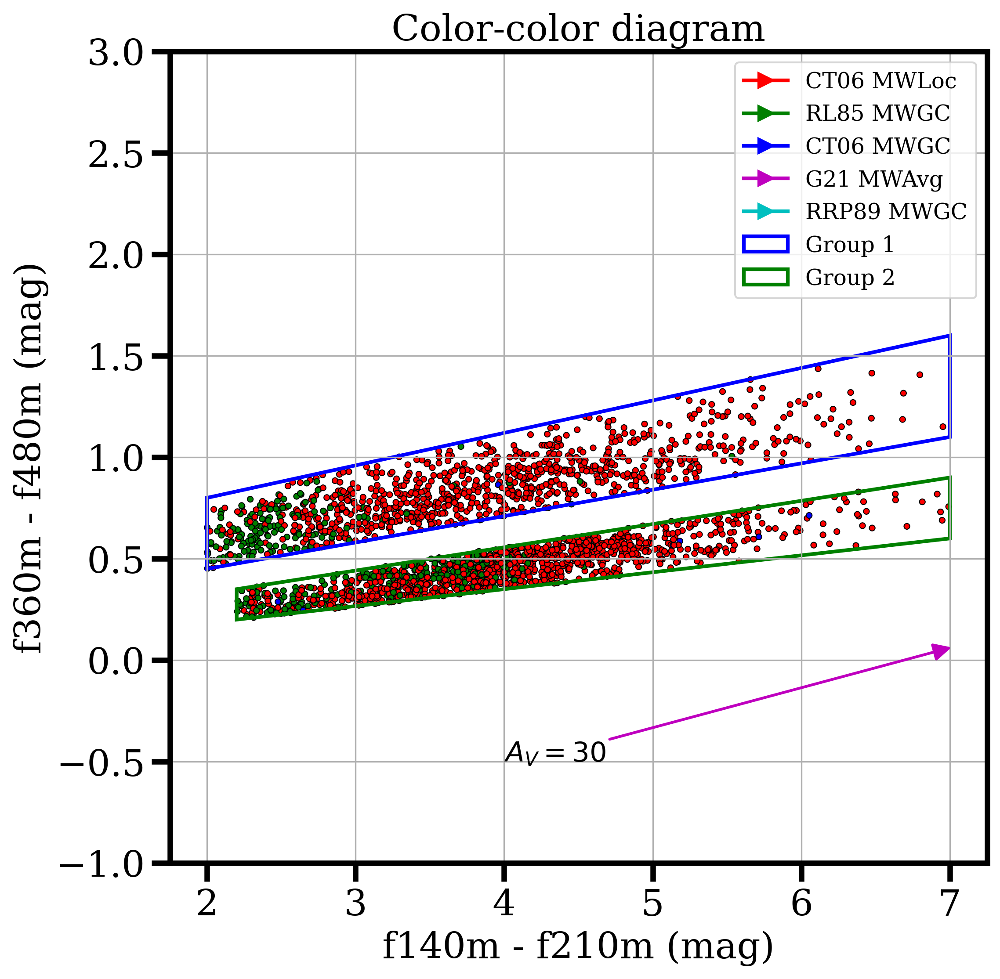

In [28]:
from matplotlib.path import Path
from matplotlib.patches import Polygon  
#color color diagram (F140M-F210M vs F360M-F480M) colored by classfication done by seshat
color1 = mags['f140m'][0] - mags['f210m'][0]
color2 = mags['f360m'][0] - mags['f480m'][0]

#
color_for_points_upper = my_catalog_classified_upper['Predicted_Class'].map({'YSO': 'red', 'FS': 'blue', 'Gal': 'green'})
color_for_points_lower = my_catalog_classified_lower['Predicted_Class'].map({'YSO': 'red', 'FS': 'blue', 'Gal': 'green'}) 

# print what fraction of sources in upper and lower branch are classified as YSO, FS, and Gal
print("Upper branch classification:")
print(my_catalog_classified_upper['Predicted_Class'].value_counts(normalize=True))
print("Lower branch classification:")
print(my_catalog_classified_lower['Predicted_Class'].value_counts(normalize=True))
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
cmap = plt.get_cmap('rainbow')
norm = LogNorm(vmin=10, vmax=5e2)
ax.scatter(color1[idx1].value, color2[idx1].value, s=10, c=color_for_points_upper, edgecolor='black', linewidth=0.5,)
ax.scatter(color1[idx2].value, color2[idx2].value, s=10, c=color_for_points_lower, edgecolor='black', linewidth=0.5)
ax.set_xlabel('f140m - f210m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('Color-color diagram')
ax.set_ylim(-1,3)
colorlist = ['r', 'g', 'b', 'm', 'c', 'y']
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    print(ext_model)
    plot_extvec_ccd(ax, color1=('f140m', 'f210m'), color2=('f360m', 'f480m'),
                     ext=ext_model, extvec_scale=30, color=c,
                     color1_data=color1, color2_data=color2, start=(4,-0.5), label=labels)   

vertices_upper = [(2,0.45), (2,0.8), (7, 1.6), (7, 1.1)]
vertices_lower = [(2.2,0.2), (2.2,0.35 ), (7,0.9), (7, 0.6)]
polygon1 = Polygon(vertices_upper, closed=True, fill=False, edgecolor='blue', linewidth=2, label='Group 1')
polygon2 = Polygon(vertices_lower, closed=True, fill=False, edgecolor='green', linewidth=2, label='Group 2')
ax.add_patch(polygon1)
ax.add_patch(polygon2)
path1 = Path(vertices_upper)
idx1 = path1.contains_points(np.array([color1.value, color2.value]).T)

path2 = Path(vertices_lower)
idx2 = path2.contains_points(np.array([color1.value, color2.value]).T)
ax.legend()
ax.grid()



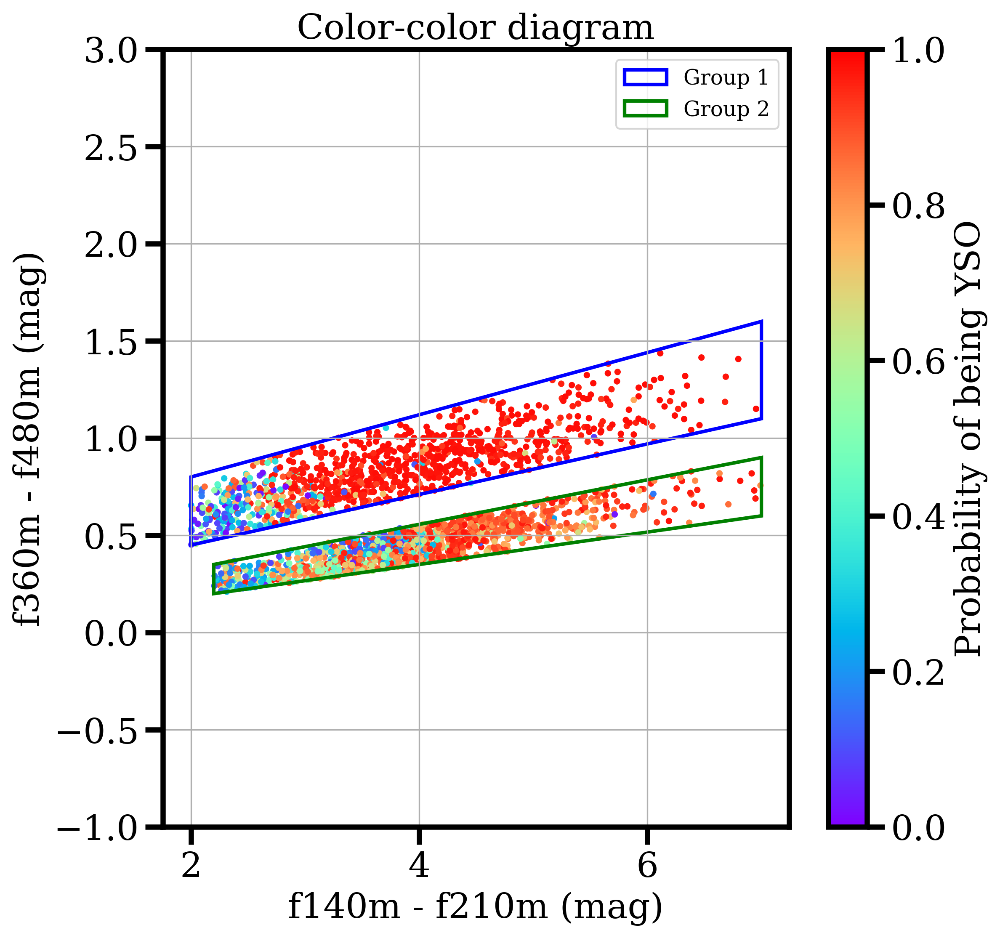

In [27]:
from matplotlib.path import Path
from matplotlib.patches import Polygon  
#color color diagram (F140M-F210M vs F360M-F480M) colored by classfication done by seshat
color1 = mags['f140m'][0] - mags['f210m'][0]
color2 = mags['f360m'][0] - mags['f480m'][0]

#
color_for_points_upper = my_catalog_classified_upper['Prob YSO']
color_for_points_lower = my_catalog_classified_lower['Prob YSO']
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
cmap = plt.get_cmap('rainbow')
ax.scatter(color1[idx1].value, color2[idx1].value, s=10, c=color_for_points_upper, cmap=cmap, vmin=0, vmax=1, linewidth=0.5,)
ax.scatter(color1[idx2].value, color2[idx2].value, s=10, c=color_for_points_lower, cmap=cmap, vmin=0, vmax=1, linewidth=0.5)
ax.set_xlabel('f140m - f210m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('Color-color diagram')
ax.set_ylim(-1,3)

# add colorbar
norm = plt.Normalize(vmin=0, vmax=1)
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
cbar.set_label('Probability of being YSO')
vertices_upper = [(2,0.45), (2,0.8), (7, 1.6), (7, 1.1)]
vertices_lower = [(2.2,0.2), (2.2,0.35 ), (7,0.9), (7, 0.6)]
polygon1 = Polygon(vertices_upper, closed=True, fill=False, edgecolor='blue', linewidth=2, label='Group 1')
polygon2 = Polygon(vertices_lower, closed=True, fill=False, edgecolor='green', linewidth=2, label='Group 2')
ax.add_patch(polygon1)
ax.add_patch(polygon2)
path1 = Path(vertices_upper)
idx1 = path1.contains_points(np.array([color1.value, color2.value]).T)

path2 = Path(vertices_lower)
idx2 = path2.contains_points(np.array([color1.value, color2.value]).T)
ax.legend()
ax.grid()



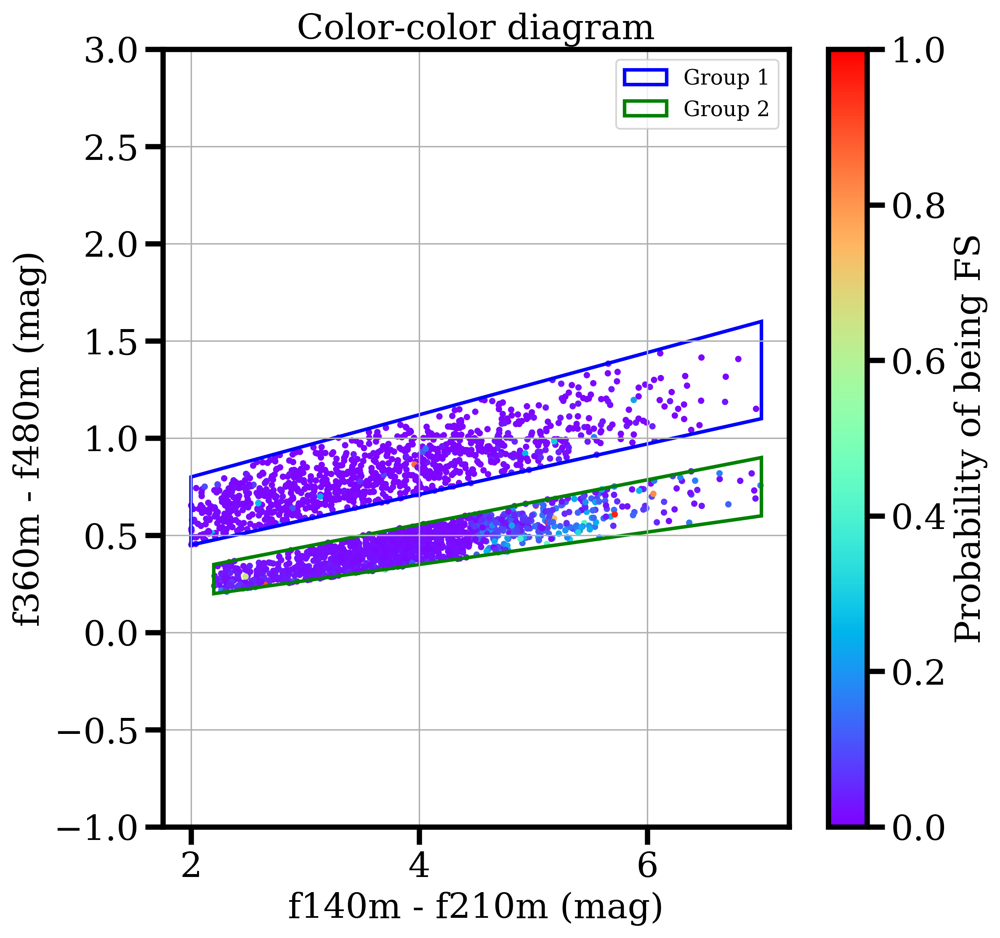

In [29]:
from matplotlib.path import Path
from matplotlib.patches import Polygon  
#color color diagram (F140M-F210M vs F360M-F480M) colored by classfication done by seshat
color1 = mags['f140m'][0] - mags['f210m'][0]
color2 = mags['f360m'][0] - mags['f480m'][0]

#
color_for_points_upper = my_catalog_classified_upper['Prob FS']
color_for_points_lower = my_catalog_classified_lower['Prob FS']
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
cmap = plt.get_cmap('rainbow')
ax.scatter(color1[idx1].value, color2[idx1].value, s=10, c=color_for_points_upper, cmap=cmap, vmin=0, vmax=1, linewidth=0.5,)
ax.scatter(color1[idx2].value, color2[idx2].value, s=10, c=color_for_points_lower, cmap=cmap, vmin=0, vmax=1, linewidth=0.5)
ax.set_xlabel('f140m - f210m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('Color-color diagram')
ax.set_ylim(-1,3)

# add colorbar
norm = plt.Normalize(vmin=0, vmax=1)
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
cbar.set_label('Probability of being FS')
vertices_upper = [(2,0.45), (2,0.8), (7, 1.6), (7, 1.1)]
vertices_lower = [(2.2,0.2), (2.2,0.35 ), (7,0.9), (7, 0.6)]
polygon1 = Polygon(vertices_upper, closed=True, fill=False, edgecolor='blue', linewidth=2, label='Group 1')
polygon2 = Polygon(vertices_lower, closed=True, fill=False, edgecolor='green', linewidth=2, label='Group 2')
ax.add_patch(polygon1)
ax.add_patch(polygon2)
path1 = Path(vertices_upper)
idx1 = path1.contains_points(np.array([color1.value, color2.value]).T)

path2 = Path(vertices_lower)
idx2 = path2.contains_points(np.array([color1.value, color2.value]).T)
ax.legend()
ax.grid()



Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:06:02.819' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE

Set DATE-AVG to '2024-09-08T11:47:44.336' from MJD-AVG.
Set DATE-END to '2024-09-08T13:00:37.070' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.791203 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291801554.144 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:55:48.768' from MJD-AVG.
Set DATE-END to '2024-09-08T13:08:42.701' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.785099 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291756623.231 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE

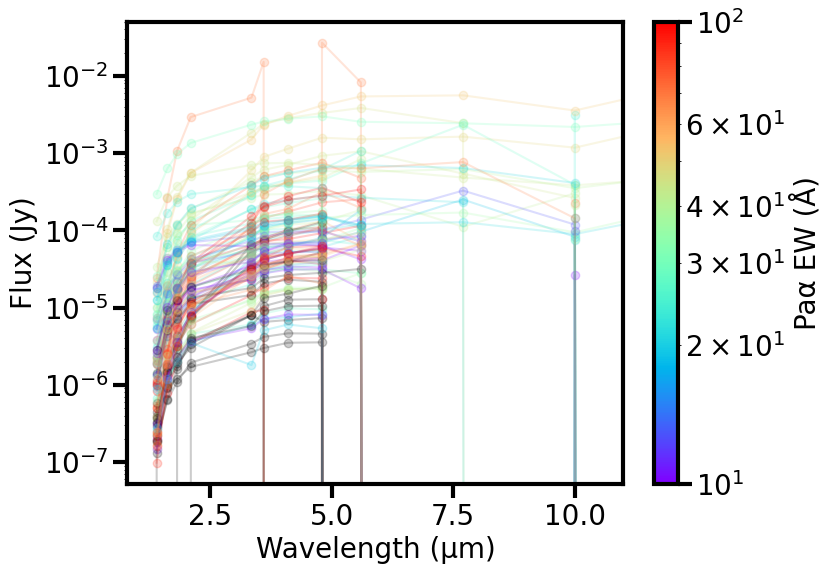

In [ ]:
def plot_SED(catalog, idx_mask):
    fig, ax = plt.subplots(figsize=(8, 6))
    filter_names = ['f140m', 'f162m', 'f182m',  'f210m', 'f335m', 'f360m', 'f410m', 'f480m', 'f560w', 'f770w', 'f1000w', 'f1280w', 'f2100w']
    wavelengths = np.array([int(f[1:-1]) / 100 for f in filter_names]) * u.um

    src_idx = np.where(idx_mask)[0]   # convert boolean mask -> integer indices
    # get random 100 indices from src_idx
    if len(src_idx) > 100:
        src_idx = np.random.choice(src_idx, size=100, replace=False)
    # optional color normalization
    norm = LogNorm(vmin=10, vmax=100)
    cmap = plt.get_cmap("rainbow")

    for i in src_idx:
        flux_arr = []
        for filtername in filter_names:
            flux = (
                catalog['flux_fit_' + filtername][i] * u.MJy / u.sr
                * WCS(fits.getheader(image_filenames[filtername], ext=('SCI', 1))).proj_plane_pixel_area()
            ).to(u.Jy)
            flux_arr.append(flux.value)

        ax.plot(wavelengths.value, flux_arr, marker='o', alpha=0.2,
                color=cmap(norm(paa_excess_ew[i])))

    cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
    cbar.set_label('Paα EW (Å)')
    ax.set_yscale('log')
    ax.set_xlabel('Wavelength (µm)')
    ax.set_ylabel('Flux (Jy)')
    ax.set_xlim(0.8, 11)
    plt.show()
plot_SED(catalog, idx1)

Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:06:02.819' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE

Set OBSGEO-B to    -3.810003 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291940033.618 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:31:04.265' from MJD-AVG.
Set DATE-END to '2024-09-08T12:43:52.463' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.803760 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291894033.527 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:39:49.277' from MJD-AVG.
Set DATE-END to '2024-09-08T12:52:42.510' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.797166 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291845460.779 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:47:44.336' from MJD-AVG.
Set DATE-END to '2024-09-08T13:00:37.070' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.791203 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291801554.144 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:55:48.768' from MJD-AVG.
Set DATE-END to '2024-09-08T13:08:42.701' from MJD-END'. [astropy.wcs.wcs]
Set OBSG

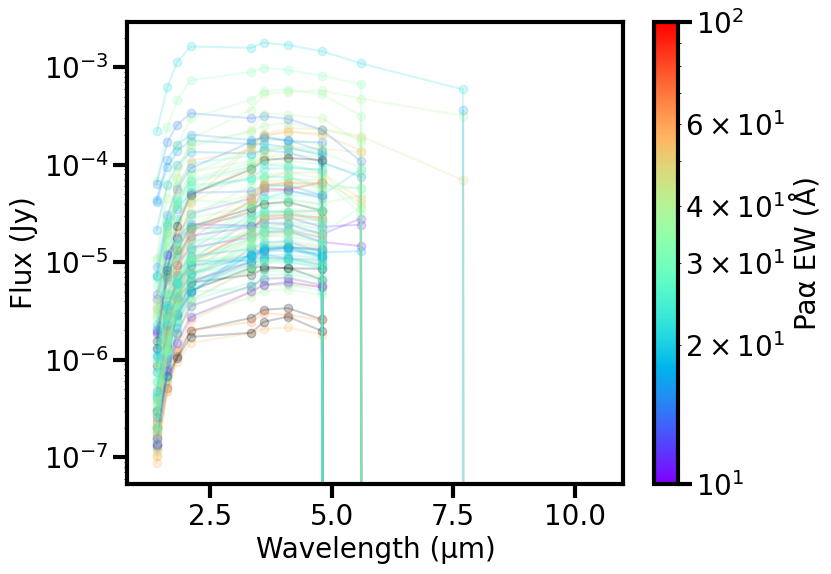

In [ ]:
plot_SED(catalog, idx2)

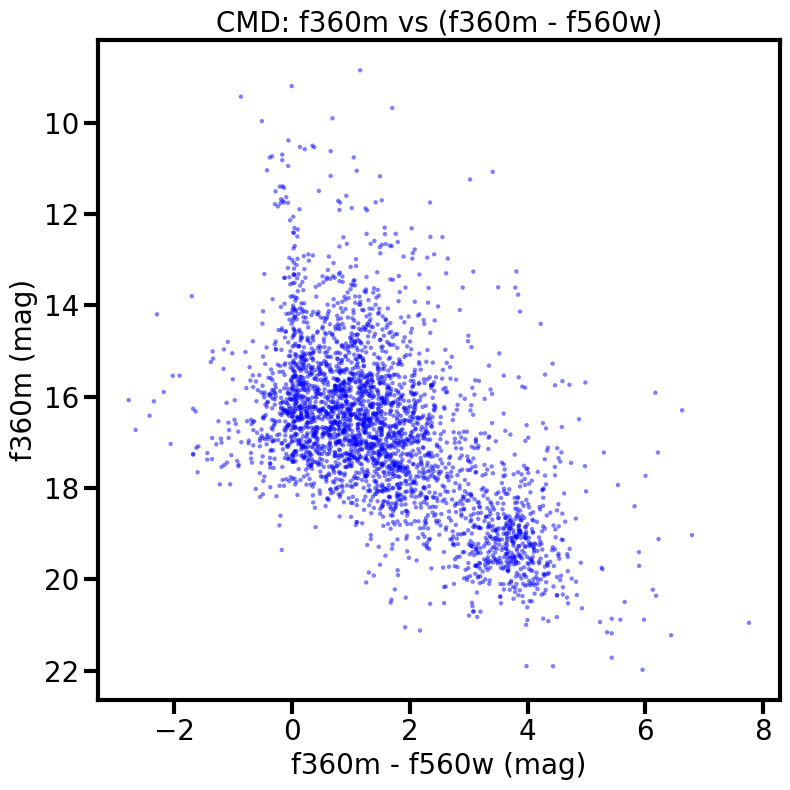

In [ ]:
#plot f360 vs f360-f560w, with no color coding

mag = filters['f360m'][0]
color = filters['f360m'][0] - filters['f560w'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color.value, mag.value, s=10, c='blue', alpha=0.5, edgecolor='none')
ax.set_xlabel('f360m - f560w (mag)')
ax.set_ylabel('f360m (mag)')
ax.set_title('CMD: f360m vs (f360m - f560w)')
ax.invert_yaxis()  # Invert y-axis for magnitude
plt.tight_layout()

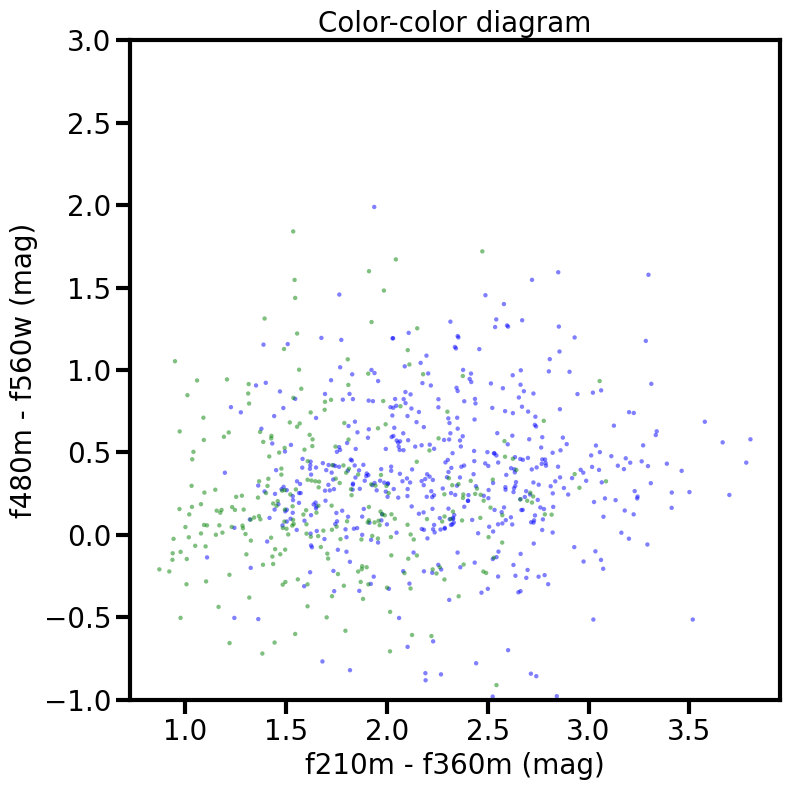

In [ ]:
# 210-f360 vs 480-560
color1 = filters['f210m'][0] - filters['f360m'][0]
color2 = filters['f480m'][0] - filters['f560w'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color1.value[idx1], color2.value[idx1], s=10, c='blue', alpha=0.5, edgecolor='none')
ax.scatter(color1.value[idx2], color2.value[idx2], s=10, c='green', alpha=0.5, edgecolor='none')
ax.set_xlabel('f210m - f360m (mag)')
ax.set_ylabel('f480m - f560w (mag)')
ax.set_title('Color-color diagram')
ax.set_ylim(-1,3)
plt.tight_layout()

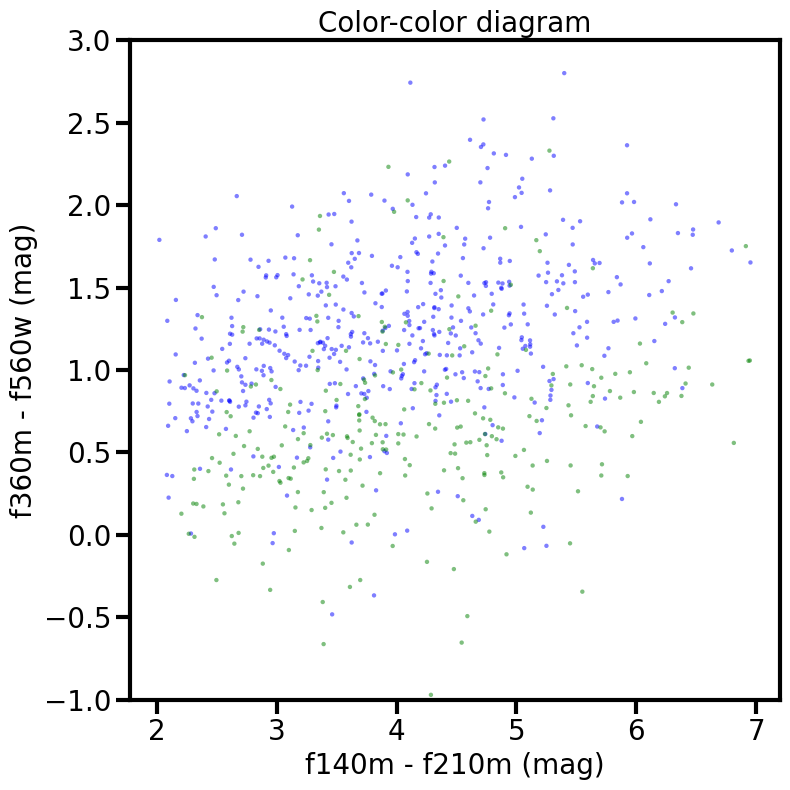

In [ ]:
#140-210 vs 360-560
color1 = filters['f140m'][0] - filters['f210m'][0]
color2 = filters['f360m'][0] - filters['f560w'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color1.value[idx1], color2.value[idx1], s=10, c='blue', alpha=0.5, edgecolor='none')
ax.scatter(color1.value[idx2], color2.value[idx2], s=10, c='green', alpha=0.5, edgecolor='none')
ax.set_xlabel('f140m - f210m (mag)')
ax.set_ylabel('f360m - f560w (mag)')
ax.set_title('Color-color diagram')
ax.set_ylim(-1,3)
plt.tight_layout()

(-1.0, 2.3)

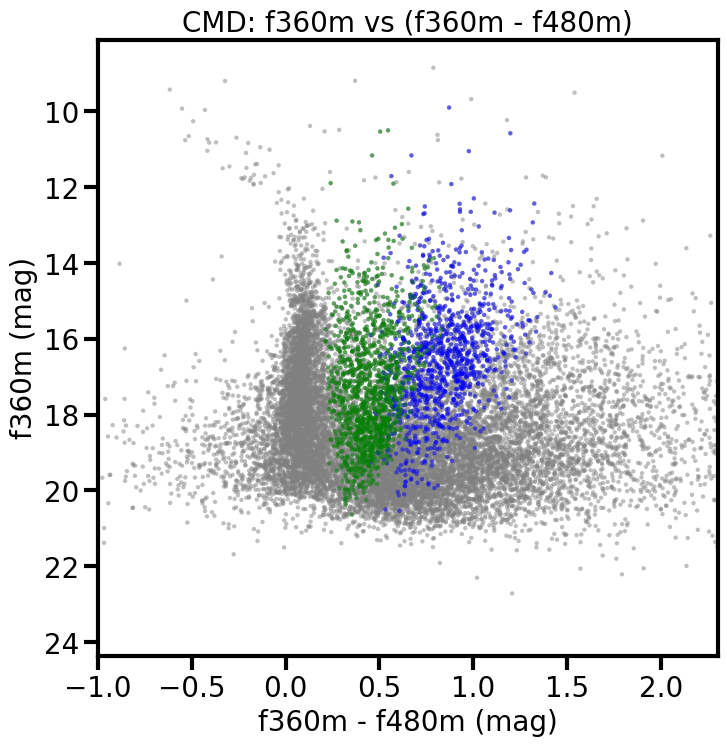

In [ ]:
# plot 360-480 vs 360 and mark upper and lower branch pop
color1 = filters['f360m'][0] - filters['f480m'][0]
mag1 = filters['f360m'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color1.value, mag1.value, s=10, c='gray', alpha=0.5, edgecolor='none', label='All sources')
ax.scatter(color1.value[idx1], mag1.value[idx1], s=10, c='blue', alpha=0.5, edgecolor='none', label='Group 1')  
ax.scatter(color1.value[idx2], mag1.value[idx2], s=10, c='green', alpha=0.5, edgecolor='none', label='Group 2')
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('f360m (mag)')
ax.set_title('CMD: f360m vs (f360m - f480m)')
ax.invert_yaxis()  # Invert y-axis for magnitude
ax.set_xlim(-1, 2.3)

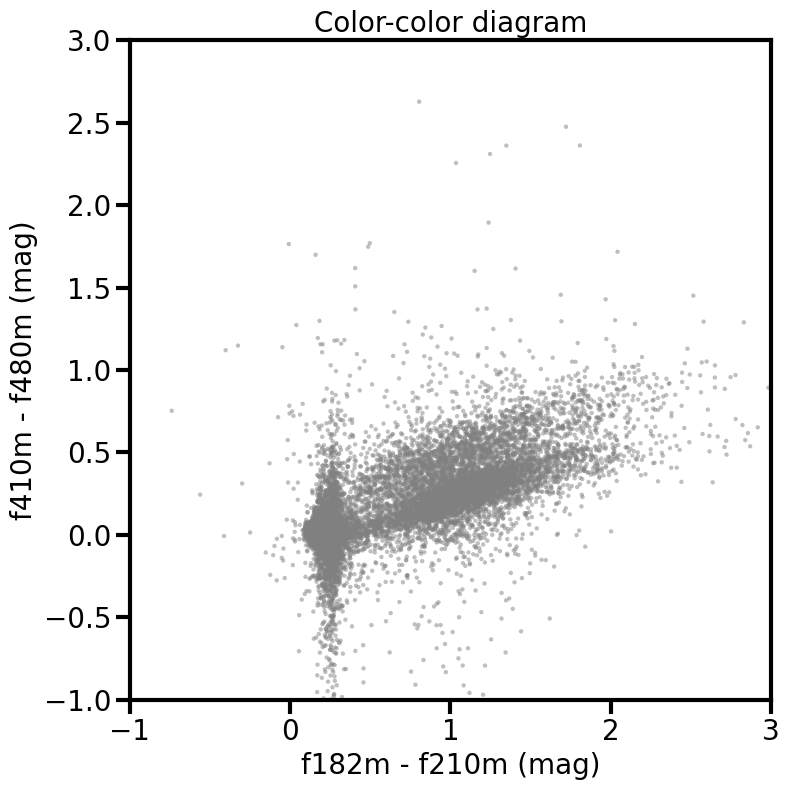

In [ ]:
#182-210 vs 410 - 480
color1 = filters['f182m'][0] - filters['f210m'][0]
color2 = filters['f410m'][0] - filters['f480m'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color1.value, color2.value, s=10, c='gray', alpha=0.5, edgecolor='none', label='All sources')

ax.set_xlabel('f182m - f210m (mag)')
ax.set_ylabel('f410m - f480m (mag)')
ax.set_title('Color-color diagram')
ax.set_ylim(-1,3)
ax.set_xlim(-1,3)
plt.tight_layout()

[ True  True  True  True  True  True]
Matched 6 out of 6 Kang+09 sources within 0.2 arcsec


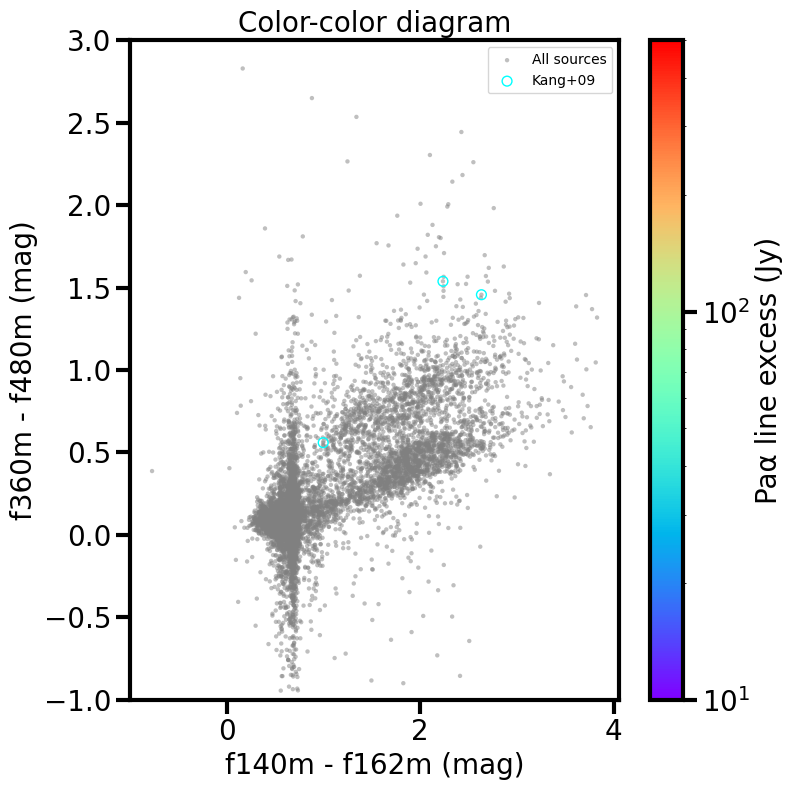

In [ ]:
ra_kang09 = [290.9033,  290.92963, 290.950565, 290.949425, 290.956121, 290.95945 ]
dec_kang09 = [14.52127,  14.48092, 14.4915651, 14.50051, 14.47373, 14.47451]




skycoord_kang09 = SkyCoord(ra=ra_kang09*u.deg, dec=dec_kang09*u.deg, frame='icrs')
idx_kang09, d2d_kang09, _ = skycoord_kang09.match_to_catalog_sky(catalog['skycoord_ref'], nthneighbor=1)
sep_lim = 0.2*u.arcsec
matched_kang09 = d2d_kang09 < sep_lim
print(matched_kang09)
print(f"Matched {np.sum(matched_kang09)} out of {len(skycoord_kang09)} Kang+09 sources within {sep_lim.to(u.arcsec)}")
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
color1 = filters['f140m'][0] - filters['f162m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
ax.scatter(color1.value, color2.value, s=10, c='gray', alpha=0.5, edgecolor='none', label='All sources')
ax.scatter(color1.value[idx_kang09], color2.value[idx_kang09], s=50, edgecolor='cyan', facecolor='none', marker='o', label='Kang+09')
ax.set_xlabel('f140m - f162m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('Color-color diagram')
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
cbar.set_label('Paα line excess (Jy)')
ax.set_ylim(-1,3)
ax.legend()
plt.tight_layout()

     b6_xsky      
------------------
290.93232480562904
  290.932371860991
  290.932455642757
 290.9324648242179
 290.9322524991548
 290.9325841838294
290.93261402393324
 290.9312758073839
290.93236152972986
  290.932482038112
               ...
  290.927746466834
 290.9266458154624
 290.9228357244253
290.93990768503437
 290.9300258558489
290.92987320532956
290.92986114376197
 290.9259042913158
290.93038336645174
 290.9290577124884
Length = 118 rows
matched_w51e_alma (array([  7,  24,  36,  66,  67,  68,  76,  78,  84,  87,  93,  95, 106]),)
Matched 13 out of 118 W51e ALMA sources within 0.05 arcsec
matched_w51n_alma (array([19, 29, 30, 44, 58, 59, 64, 66, 87]),)
Matched 9 out of 93 W51n ALMA sources within 0.05 arcsec


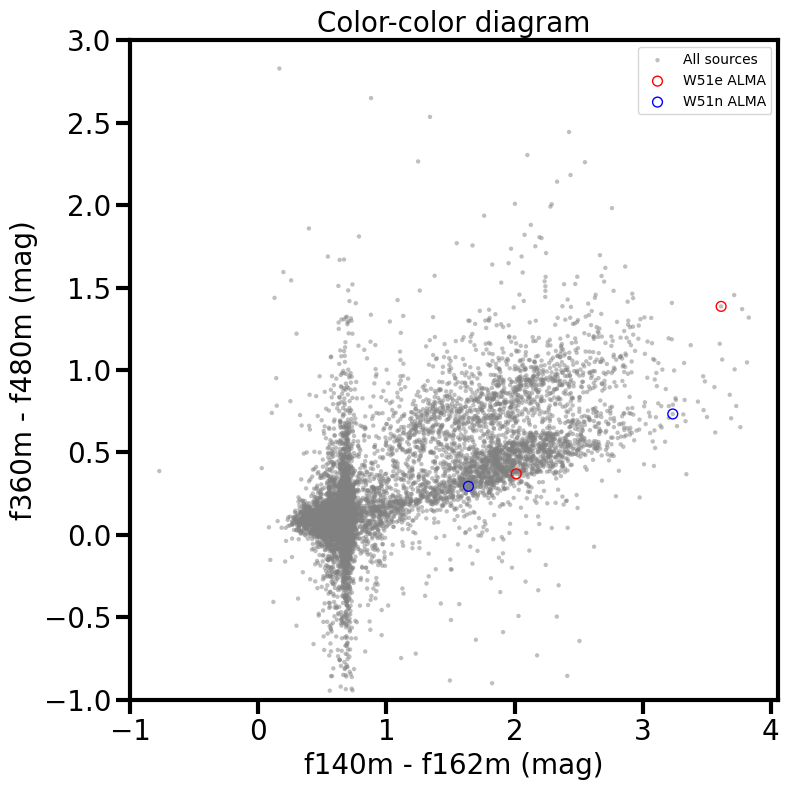

In [ ]:
w51e_alma_catalog_fn = '/orange/adamginsburg/w51/TaehwaYoo/dendro_w51e_matched_final.fits'

w51n_alma_catalog_fn = '/orange/adamginsburg/w51/TaehwaYoo/dendro_w51n_matched_final.fits'
w51e_alma_catalog = Table.read(w51e_alma_catalog_fn)
w51n_alma_catalog = Table.read(w51n_alma_catalog_fn)


#w51e_matched_idx = [3, 7, 36, 66, 67, 68, 76, 78, 93, 95, 106]
#w51n_matched_idx = [19, 22, 29, 30, 58, 59, 64, 66, 76, 89, 90, 91]
w51e_alma_b3_ra = w51e_alma_catalog['b3_xsky']
w51e_alma_b3_dec = w51e_alma_catalog['b3_ysky']
w51e_alma_b6_ra = w51e_alma_catalog['b6_xsky']
w51e_alma_b6_dec = w51e_alma_catalog['b6_ysky']
w51n_alma_b3_ra = w51n_alma_catalog['b3_xsky']
w51n_alma_b3_dec = w51n_alma_catalog['b3_ysky']
w51n_alma_b6_ra = w51n_alma_catalog['b6_xsky']
w51n_alma_b6_dec = w51n_alma_catalog['b6_ysky']


w51e_alma_ra = w51e_alma_b6_ra.copy()
w51e_alma_ra[w51e_alma_ra<0] = w51e_alma_b3_ra[w51e_alma_ra<0]
w51e_alma_dec = w51e_alma_b6_dec.copy()
w51e_alma_dec[w51e_alma_dec<0] = w51e_alma_b3_dec[w51e_alma_dec<0]
w51n_alma_ra = w51n_alma_b6_ra.copy()
w51n_alma_ra[w51n_alma_ra<0] = w51n_alma_b3_ra[w51n_alma_ra < 0]
w51n_alma_dec = w51n_alma_b6_dec.copy()
w51n_alma_dec[w51n_alma_dec<0] = w51n_alma_b3_dec[w51n_alma_dec<0]



skycoord_w51e_alma = SkyCoord(ra=w51e_alma_ra*u.deg, dec=w51e_alma_dec*u.deg, frame='icrs')

skycoord_w51n_alma = SkyCoord(ra=w51n_alma_ra*u.deg, dec=w51n_alma_dec*u.deg, frame='icrs')

print(w51e_alma_ra)
idx_w51e_alma, d2d_w51e_alma, _ = skycoord_w51e_alma.match_to_catalog_sky(catalog['skycoord_ref'], nthneighbor=1)
alma_w51e_sep_lim = 0.05*u.arcsec
matched_w51e_alma = d2d_w51e_alma < alma_w51e_sep_lim

print('matched_w51e_alma', np.where(matched_w51e_alma))
print(f"Matched {np.sum(matched_w51e_alma)} out of {len(skycoord_w51e_alma)} W51e ALMA sources within {alma_w51e_sep_lim.to(u.arcsec)}")    

idx_w51n_alma, d2d_w51n_alma, _ = skycoord_w51n_alma.match_to_catalog_sky(catalog['skycoord_ref'], nthneighbor=1)
alma_w51n_sep_lim = 0.05*u.arcsec
matched_w51n_alma = d2d_w51n_alma < alma_w51n_sep_lim
print('matched_w51n_alma', np.where(matched_w51n_alma))
print(f"Matched {np.sum(matched_w51n_alma)} out of {len(skycoord_w51n_alma)} W51n ALMA sources within {alma_w51n_sep_lim.to(u.arcsec)}")
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
color1 = filters['f140m'][0] - filters['f162m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
ax.scatter(color1.value, color2.value, s=10, c='gray', alpha=0.5, edgecolor='none', label='All sources')
ax.scatter(color1.value[idx_w51e_alma[matched_w51e_alma]], color2.value[idx_w51e_alma[matched_w51e_alma]], s=50, edgecolor='red', facecolor='none', marker='o', label='W51e ALMA')
ax.scatter(color1.value[idx_w51n_alma[matched_w51n_alma]], color2.value[idx_w51n_alma[matched_w51n_alma]], s=50, edgecolor='blue', facecolor='none', marker='o', label='W51n ALMA')
ax.set_xlabel('f140m - f162m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('Color-color diagram')

ax.set_ylim(-1,3)
ax.legend()
plt.tight_layout()

Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


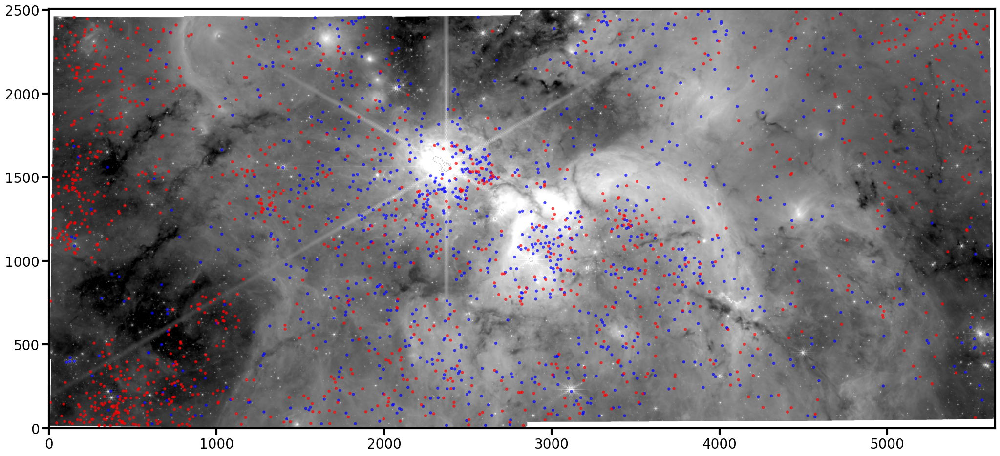

In [ ]:
from astropy.visualization import simple_norm
# plot spatial distribution of the two groups
fig = plt.figure(figsize=(25,25))
ax = fig.add_axes(111)
skycoord = catalog['skycoord_ref']
pixcoord_f480m = WCS(fits.getheader(image_filenames['f480m'], ext=('SCI', 1))).world_to_pixel(skycoord)
img_f480m = fits.getdata(image_filenames['f480m'], ext=('SCI', 1))
norm = simple_norm(img_f480m, stretch='log', percent=99)
ax.imshow(img_f480m, origin='lower', cmap='gray', norm=norm)
ax.scatter(pixcoord_f480m[0][idx1], pixcoord_f480m[1][idx1], s=20, c='blue', alpha=0.7, edgecolor='none', label='Group 1')
ax.scatter(pixcoord_f480m[0][idx2], pixcoord_f480m[1][idx2], s=20, c='red', alpha=0.7, edgecolor='none', label='Group 2')


Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/astropy/visualization/wcsaxes/core.py:248: UserWarning: The following kwargs were not used by contour: 'lwidths', 'label'
  cset = super().contour(*args, **kwargs)
/scratch/local/33577455/ipykernel_4015784/1806488463.py:24: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


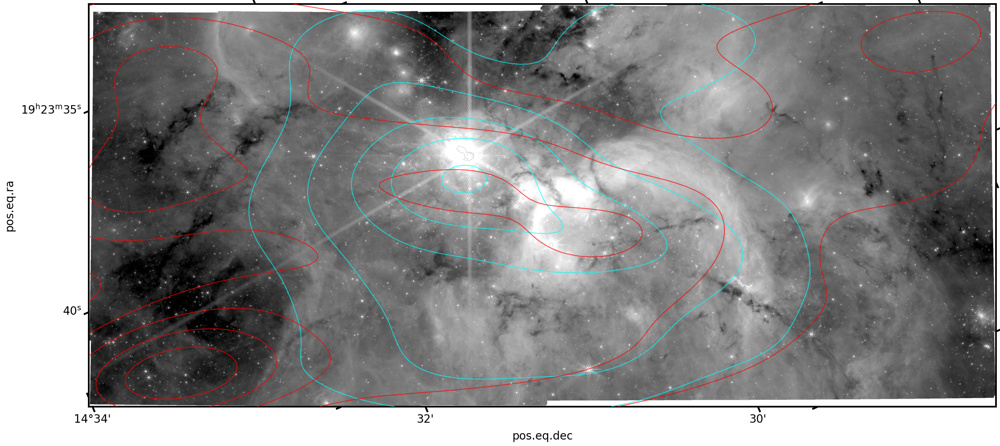

In [ ]:
# make density contours for idx1 and idx2 in F480m image
from scipy.stats import gaussian_kde
pixcoord_f480m = WCS(fits.getheader(image_filenames['f480m'], ext=('SCI', 1))).world_to_pixel(skycoord)
img_f480m = fits.getdata(image_filenames['f480m'], ext=('SCI', 1))
x1 = pixcoord_f480m[0][idx1]
y1 = pixcoord_f480m[1][idx1]
x2 = pixcoord_f480m[0][idx2]    
y2 = pixcoord_f480m[1][idx2]
xy1 = np.vstack([x1, y1])
xy2 = np.vstack([x2, y2])
kde1 = gaussian_kde(xy1)
kde2 = gaussian_kde(xy2)
xgrid = np.linspace(0, img_f480m.shape[1], 100)
ygrid = np.linspace(0, img_f480m.shape[0], 100)
Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)
Z1 = kde1(np.vstack([Xgrid.ravel(), Ygrid.ravel()])).reshape(Xgrid.shape)
Z2 = kde2(np.vstack([Xgrid.ravel(), Ygrid.ravel()])).reshape(Xgrid.shape)
fig = plt.figure(figsize=(25,25))
ax = fig.add_axes(111,  projection=WCS(fits.getheader(image_filenames['f480m'], ext=('SCI', 1))))   
norm = simple_norm(img_f480m, stretch='log', percent=99)
ax.imshow(img_f480m, origin='lower', cmap='gray', norm=norm)
ax.contour(Xgrid, Ygrid, Z1, levels=5, colors='cyan', alpha=0.7, lwidths=4, label='upper branch')
ax.contour(Xgrid, Ygrid, Z2, levels=5, colors='red', alpha=0.7, lwidths=4, label='lower branch')
ax.legend()
plt.tight_layout()
plt.show()

Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


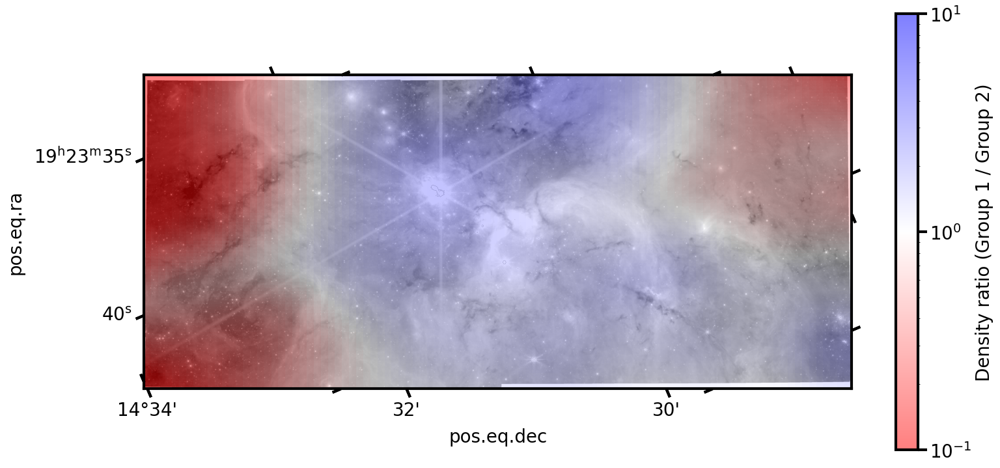

In [ ]:
# make a 2d map of the density ratio Z1/Z2 to show where group 1 vs group 2 dominate
ratio = Z1 / (Z2 + 1e-10)

fig = plt.figure(figsize=(16,8))
ax = fig.add_axes(111, projection=WCS(fits.getheader(image_filenames['f480m'], ext=('SCI', 1))))
norm = simple_norm(img_f480m, stretch='log', percent=99)

ax.imshow(img_f480m, origin='lower', cmap='gray', norm=norm)

norm = LogNorm(vmin=0.1, vmax=10)
im = ax.imshow(
    ratio,
    origin='lower',
    cmap='bwr_r',
    alpha=0.5,
    norm=norm,
    extent=[xgrid.min(), xgrid.max(), ygrid.min(), ygrid.max()],  # key fix
    interpolation='nearest'
)

cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Density ratio (Group 1 / Group 2)')
plt.tight_layout()
plt.show()

Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/astropy/visualization/wcsaxes/core.py:248: UserWarning: The following kwargs were not used by contour: 'label'
  cset = super().contour(*args, **kwargs)
/scratch/local/33577455/ipykernel_4015784/1752114106.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


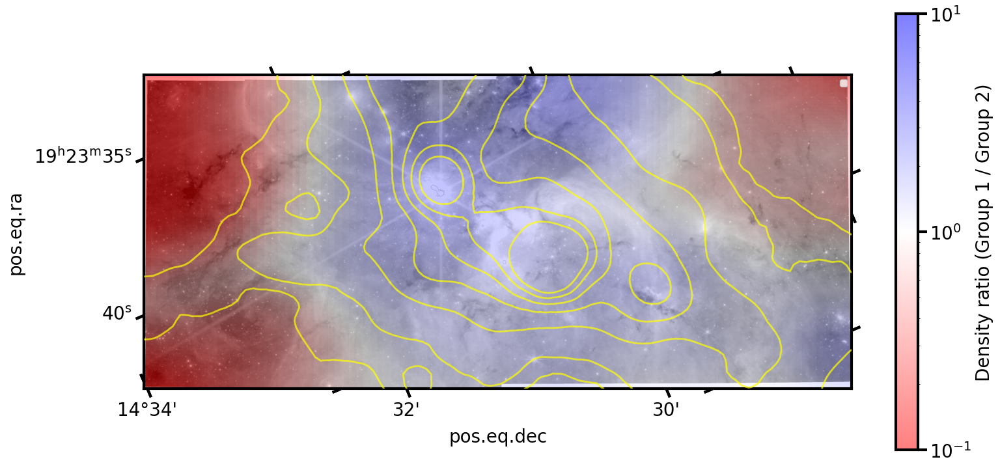

In [ ]:
# make a 2d map of the density ratio Z1/Z2 to show where group 1 vs group 2 dominate
ratio = Z1 / (Z2 + 1e-10)

fig = plt.figure(figsize=(16,8))
ax = fig.add_axes(111, projection=WCS(fits.getheader(image_filenames['f480m'], ext=('SCI', 1))))
norm = simple_norm(img_f480m, stretch='log', percent=99)

ax.imshow(img_f480m, origin='lower', cmap='gray', norm=norm)

norm = LogNorm(vmin=0.1, vmax=10)
im = ax.imshow(
    ratio,
    origin='lower',
    cmap='bwr_r',
    alpha=0.5,
    norm=norm,
    extent=[xgrid.min(), xgrid.max(), ygrid.min(), ygrid.max()],  # key fix
    interpolation='nearest'
)

cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Density ratio (Group 1 / Group 2)')
co_planck_fn = '/orange/adamginsburg/jwst/w51/data_reprojected_480/co_planck_reprojected_to_f480m.fits'
co_plank = fits.getdata(co_planck_fn, ext=0)

# plot contour of co_planck on top at level of 2, 2.78, 5.11, 9.00, 14.44, 21.44, 30.0
co_planck_norm = simple_norm(co_plank, stretch='log', percent=99)
ax.contour(co_plank, levels=[2, 2.78, 5.11, 9.00, 14.44, 21.44, 30.0], colors='yellow', alpha=0.7, linewidths=2, label='Planck CO')
ax.legend()


plt.tight_layout()
plt.show()

Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


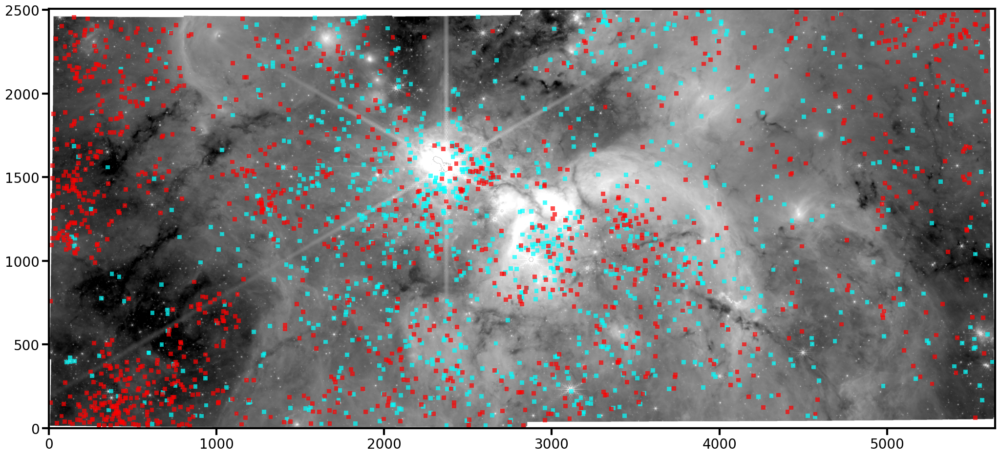

In [ ]:
from astropy.visualization import simple_norm
# plot spatial distribution of the two groups
fig = plt.figure(figsize=(25,25))
ax = fig.add_axes(111)
skycoord = catalog['skycoord_ref']
pixcoord_f480m = WCS(fits.getheader(image_filenames['f480m'], ext=('SCI', 1))).world_to_pixel(skycoord)
img_f480m = fits.getdata(image_filenames['f480m'], ext=('SCI', 1))
norm = simple_norm(img_f480m, stretch='log', percent=99)
ax.imshow(img_f480m, origin='lower', cmap='gray',norm=norm)
ax.scatter(pixcoord_f480m[0][idx1], pixcoord_f480m[1][idx1], s=40, c='cyan', marker='s', alpha=0.7, edgecolor='none', label='Group 1')
ax.scatter(pixcoord_f480m[0][idx2], pixcoord_f480m[1][idx2], s=40, c='red', marker='s', alpha=0.7, edgecolor='none', label='Group 2')


In [ ]:
catalog_upper_branch = catalog[idx1]
catalog_lower_branch = catalog[idx2]
catalog_upper_branch.write('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/catalog_upper_branch.fits', overwrite=True)
catalog_lower_branch.write('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/catalog_lower_branch.fits', overwrite=True)

In [ ]:
from regions import Regions
test_branch_reg = Regions.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51//catalogs//test_branch.reg')
skycoord_idx1 = catalog['skycoord_ref'][idx1]
skycoord_idx2 = catalog['skycoord_ref'][idx2]
wcs = WCS(fits.getheader(image_filenames['f140m'], ext=('SCI', 1)))
idx_of_idx1 = np.any([region.contains(skycoord_idx1, wcs=wcs) for region in test_branch_reg], axis=0)
idx_of_idx2 = np.any([region.contains(skycoord_idx2, wcs=wcs) for region in test_branch_reg], axis=0)



Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]


Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:06:02.819' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE

Set DATE-AVG to '2025-05-06T16:06:02.828' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:22:58.102' from MJD-AVG.
Set DATE-END to '2024-09-08T12:35:44.015' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.810003 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291940033.618 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:31:04.265' from MJD-AVG.
Set DATE-END to '2024-09-08T12:43:52.463' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.803760 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291894033.527 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE

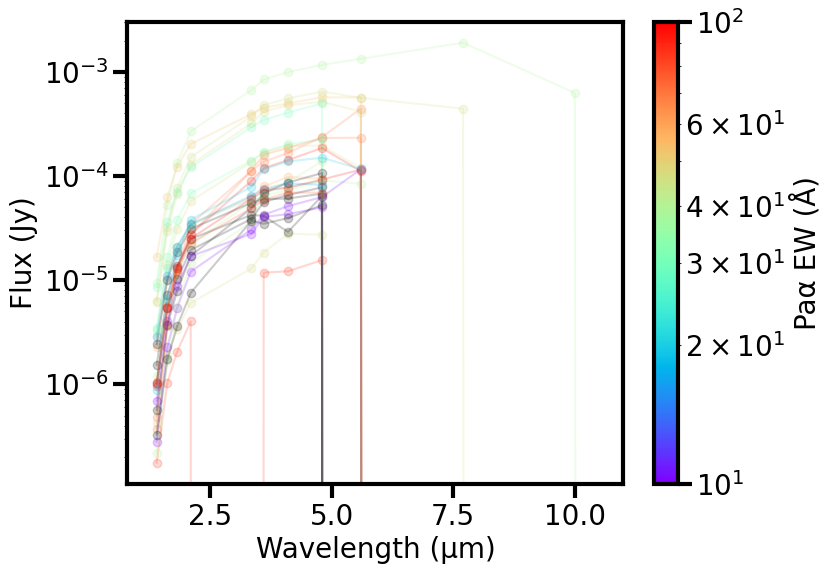

In [ ]:
mask_idx1_in_region = np.zeros(len(catalog), dtype=bool)
mask_idx1_in_region[idx1] = idx_of_idx1
plot_SED(catalog, mask_idx1_in_region)

Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:06:02.819' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE

Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:06:02.819' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:01.510' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.130' from MJD-END'. [astropy.wcs.wcs]
Set OBSG

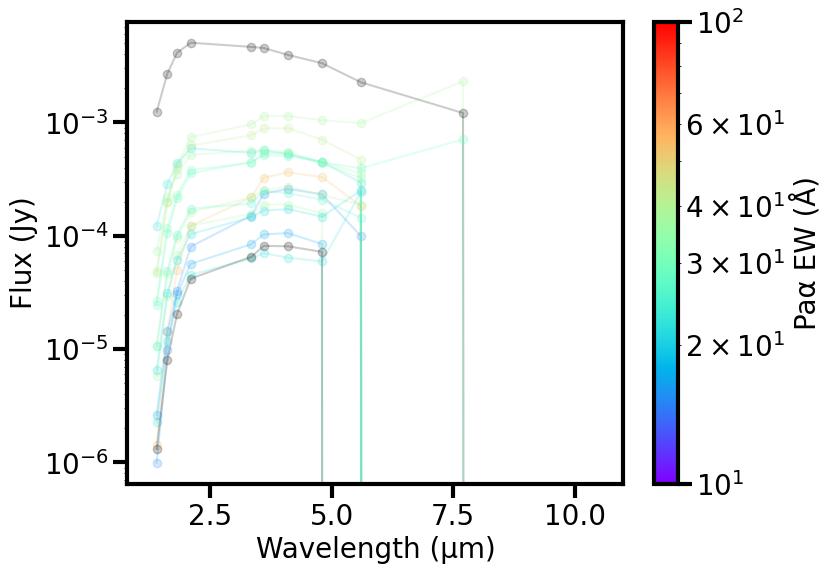

In [ ]:
mask_idx2_in_region = np.zeros(len(catalog), dtype=bool)
mask_idx2_in_region[idx2] = idx_of_idx2
plot_SED(catalog, mask_idx2_in_region)

(-1.0, 3.0)

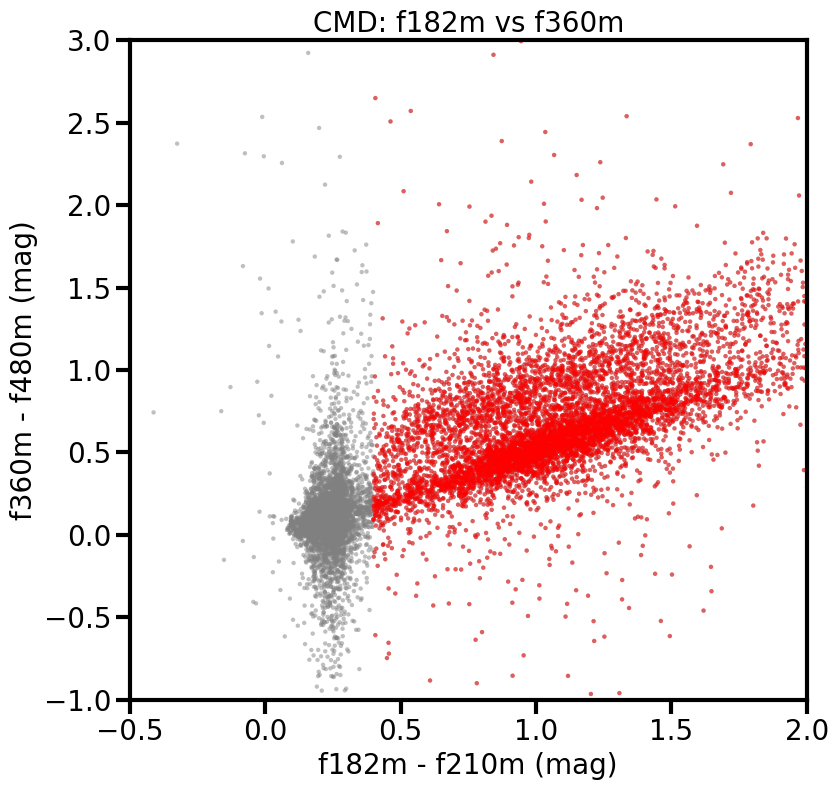

In [ ]:
# plot 182-210 vs 360-480, color coded by PaA excess
color1 = filters['f182m'][0] - filters['f210m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color1.value, color2.value, s=10, c='gray', alpha=0.5, edgecolor='none')

red_source = np.where(color1.value>0.4)[0]
ax.scatter(color1.value[red_source], color2.value[red_source], s=10, c='red', alpha=0.5, edgecolor='none', label='Red sources')

ax.set_xlabel('f182m - f210m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('CMD: f182m vs f360m')
ax.invert_yaxis()  # Invert y-axis for magnitude
plt.tight_layout()
ax.set_xlim(-0.5, 2)
ax.set_ylim(-1, 3)

 col1    col2    col3       col4          col5       col6   col7   col8   col9 col10 col11 col12  col13 col14 col15 col16 col17 col18   col19   col20  col21   col22    col23     col24     col25   col26   col27   col28  col29  col30  col31  col32  col33  col34  col35  col36  col37  col38  col39  col40  col41  col42  col43  col44  col45  col46  col47  col48  col49  col50 
------ ------- ------- -------------- ------------ ------- ------ ------ ----- ----- ----- ------ ----- ----- ----- ----- ----- ----- --------- ----- -------- ------ --------- --------- --------- ------ ------- ------- ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------
0.0207 0.15867     6.0   0.0908484459 1.0897678296   0.091  -1.33 3.4326 3.409     0   0.0  0.545   0.0   0.0   0.0   0.0   0.0    -1 -3.89e-14   0.0   0.6936 0.2855  0.003749  0.001011  0.009172   -1.0 0.02085   8.095  9.712  7.478  6.249  5.749  5.324 

(27.0, 5.0)

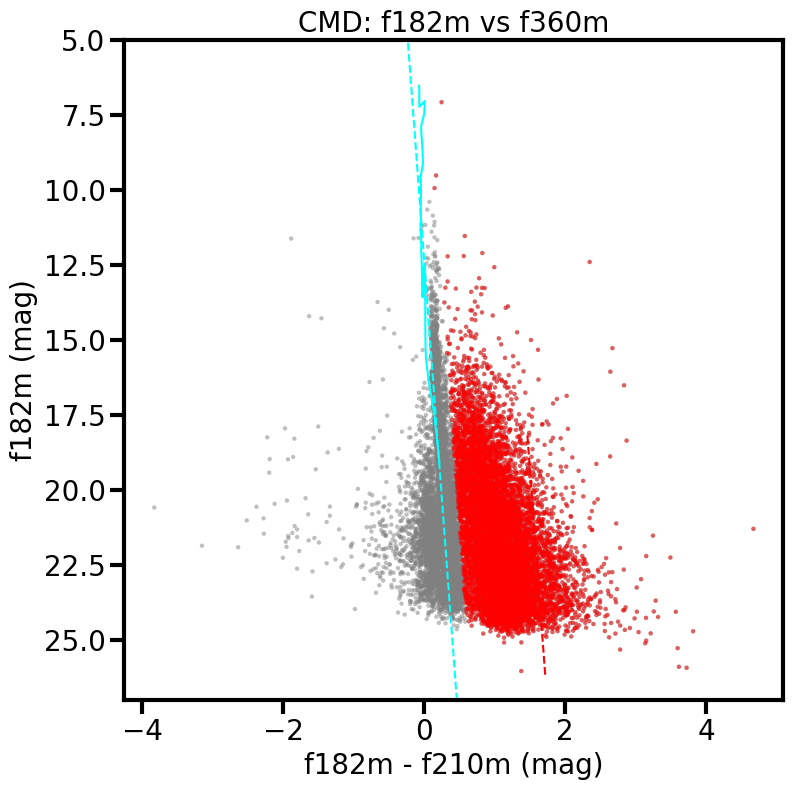

In [ ]:
# plot 182-210 vs 360-480, color coded by PaA excess
from astropy.table import Table
import crds
parsec_av0 = Table.read('/home/t.yoo/parsec_av0.txt', format='ascii')
parsec_av0.pprint(max_width=-1, max_lines=-1)   
m_init = parsec_av0['col4']  
parsec_av0 = parsec_av0[m_init<300]              
logage_av0 = parsec_av0['col3']
mass_av0 = parsec_av0['col6']
print(np.min(m_init), np.max(m_init))
print(np.min(mass_av0), np.max(mass_av0))
F140Mmag_av0 = parsec_av0['col39'] + 5*np.log10(5400)-5
F162Mmag_av0 = parsec_av0['col40']+ 5*np.log10(5400)-5
F182Mmag_av0 = parsec_av0['col41']+ 5*np.log10(5400)-5
F210Mmag_av0 = parsec_av0['col42']+ 5*np.log10(5400)-5
F335Mmag_av0 = parsec_av0['col45']+ 5*np.log10(5400)-5
F360Mmag_av0 = parsec_av0['col46']+ 5*np.log10(5400)-5
F410Mmag_av0 = parsec_av0['col47']+ 5*np.log10(5400)-5
F480Mmag_av0 = parsec_av0['col50']+ 5*np.log10(5400)-5

parsec_av10 = Table.read('/home/t.yoo/parsec_av10.txt', format='ascii')
logage_av10 = parsec_av10['col3']
mass_av10 = parsec_av10['col6']
F140Mmag_av10 = parsec_av10['col39']+ 5*np.log10(5400)-5
F162Mmag_av10 = parsec_av10['col40']+ 5*np.log10(5400)-5
F182Mmag_av10 = parsec_av10['col41']+ 5*np.log10(5400)-5
F210Mmag_av10 = parsec_av10['col42']+ 5*np.log10(5400)-5
F335Mmag_av10 = parsec_av10['col45']+ 5*np.log10(5400)-5
F360Mmag_av10 = parsec_av10['col46']+ 5*np.log10(5400)-5
F410Mmag_av10 = parsec_av10['col47']+ 5*np.log10(5400)-5
F480Mmag_av10 = parsec_av10['col50']+ 5*np.log10(5400)-5



color1 = filters['f182m'][0] - filters['f210m'][0]
mag1 = filters['f182m'][0] 
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color1.value, mag1.value, s=10, c='gray', alpha=0.5, edgecolor='none')
age_idx = logage_av0 == 6

ax.plot(F182Mmag_av0[age_idx] - F210Mmag_av0[age_idx], F182Mmag_av0[age_idx], color='cyan', label='PARSEC isochrones (A_V=0)')
idx_01msun = np.argmin(np.abs(mass_av0[age_idx]-0.1))
idx_20msun = np.argmin(np.abs(mass_av0[age_idx]-20))
isochrone_x_start = F182Mmag_av0[age_idx][idx_01msun] - F210Mmag_av0[age_idx][idx_01msun]
isochrone_x_end = F182Mmag_av0[age_idx][idx_20msun] - F210Mmag_av0[age_idx][idx_20msun]
isocrhone_y_start = F182Mmag_av0[age_idx][idx_01msun]
isocrhone_y_end = F182Mmag_av0[age_idx][idx_20msun]

A_K_scale = 5
A_V_scale = A_K_scale * 10
#ax.plot([isochrone_x_start, isochrone_x_end], [isocrhone_y_start, isocrhone_y_end], color='r', linestyle='--')
ax.plot([isochrone_x_start+(ext(1/1.82/u.um)-ext(1/2.10/u.um))*A_V_scale, isochrone_x_end+(ext(1/1.82/u.um)-ext(1/2.10/u.um))*A_V_scale], 
[isocrhone_y_start+(ext(1/1.82/u.um))*A_V_scale, isocrhone_y_end+(ext(1/1.82/u.um))*A_V_scale], color='r', linestyle='--')
# extrapolate the linear part of the isochrone to the left and right by 0.5 mag in color
color_slope = (isocrhone_y_end - isocrhone_y_start) / (isochrone_x_end - isochrone_x_start)
color_intercept = isocrhone_y_start - color_slope * isochrone_x_start
# and plot
x_vals = np.array([-1, 4])
y_vals = color_slope * x_vals + color_intercept
ax.plot(x_vals, y_vals, color='cyan', linestyle='--')
ext = CT06_MWLoc()

ax.set_xlabel('f182m - f210m (mag)')
ax.set_ylabel('f182m (mag)')
ax.set_title('CMD: f182m vs f360m')
ax.invert_yaxis()  # Invert y-axis for magnitude

red_source = np.where(color_slope*color1.value + color_intercept - mag1.value > 7)[0]
ax.scatter(color1.value[red_source], mag1.value[red_source], s=10, c='red', alpha=0.5, edgecolor='none', label='Red sources')

plt.tight_layout()
ax.set_ylim(27, 5)


In [ ]:
def get_av(color, mag, ext=RL85_MWGC(), color1=('f140m', 'f162m'), mag1=('f140m',), isochrone_line_params=(color_slope, color_intercept)):
    # Get the slope and intercept of the isochrone line
    m_iso, b_iso = isochrone_line_params

    # Get the extinction vector components
    w_color1_1 = int(color1[0][1:-1])/100*u.um
    w_color1_2 = int(color1[1][1:-1])/100*u.um
    w_mag1 = int(mag1[0][1:-1])/100*u.um
    print('w_color1_1:', w_color1_1, 'w_color1_2:', w_color1_2, 'w_mag1:', w_mag1)

    e_color1_1 = ext(1/w_color1_1)
    e_color1_2 = ext(1/w_color1_2)
    e_mag1 = ext(1/w_mag1)

    # get the contact to the isochrone line along the extinction vector
    # the extinction vector can be represented as a line with slope m_ext = e_mag1 / (e_color1_1 - e_color1_2) and passing through the point (color, mag)
    m_ext = e_mag1 / (e_color1_1 - e_color1_2)
    b_ext = mag - m_ext * color

    # find the intersection of the isochrone line and the extinction vector
    x_int = (b_ext - b_iso) / (m_iso - m_ext)
    y_int = m_iso * x_int + b_iso

    # calculate A_V as the distance from (color, mag) to (x_int, y_int) along the extinction vector
    av = (mag - y_int) / ext(1/w_mag1)
    av[av < 0] = 0
    return av
av_estimate = get_av(color.value, mag1.value, ext=CT06_MWLoc(), color1=('f182m', 'f210m'), mag1=('f182m',), isochrone_line_params=(color_slope, color_intercept))





w_color1_1: 1.82 um w_color1_2: 2.1 um w_mag1: 1.82 um


(-0.5, 2.0)

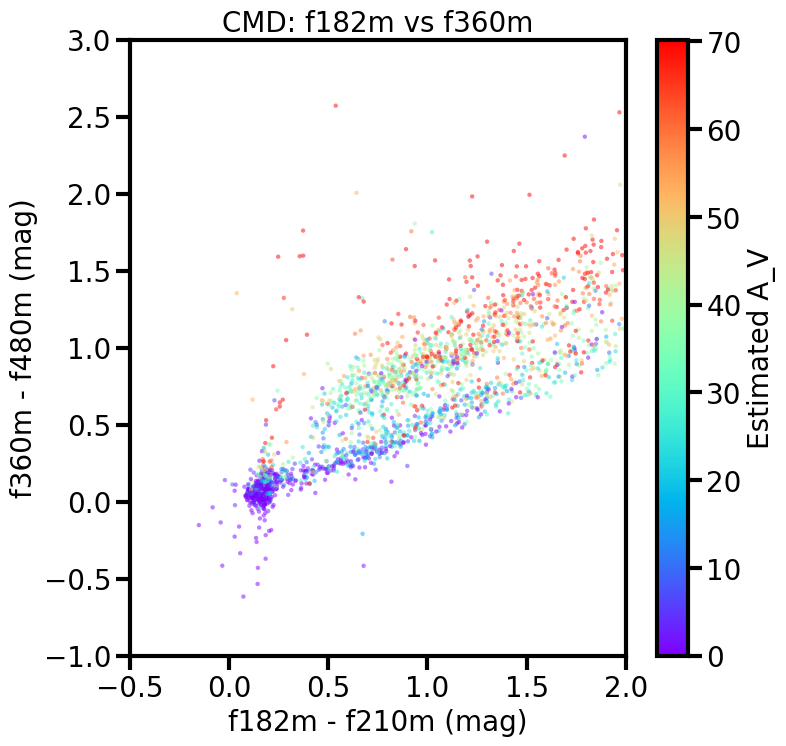

In [ ]:
# 182-210 vs 360-480, color coded by av_estimaters
color1 = filters['f182m'][0] - filters['f210m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
cmap = plt.get_cmap('rainbow')
norm = plt.Normalize(vmin=np.nanpercentile(av_estimate, 10), vmax=np.nanpercentile(av_estimate, 90))
ax.scatter(color1.value, color2.value, s=10, c=av_estimate, cmap=cmap, alpha=0.5, edgecolor='none', norm=norm)
ax.set_xlabel('f182m - f210m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('CMD: f182m vs f360m')
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
cbar.set_label('Estimated A_V')
ax.set_ylim(-1,3)
ax.set_xlim(-0.5, 2)

Text(0, 0.5, 'number of sources')

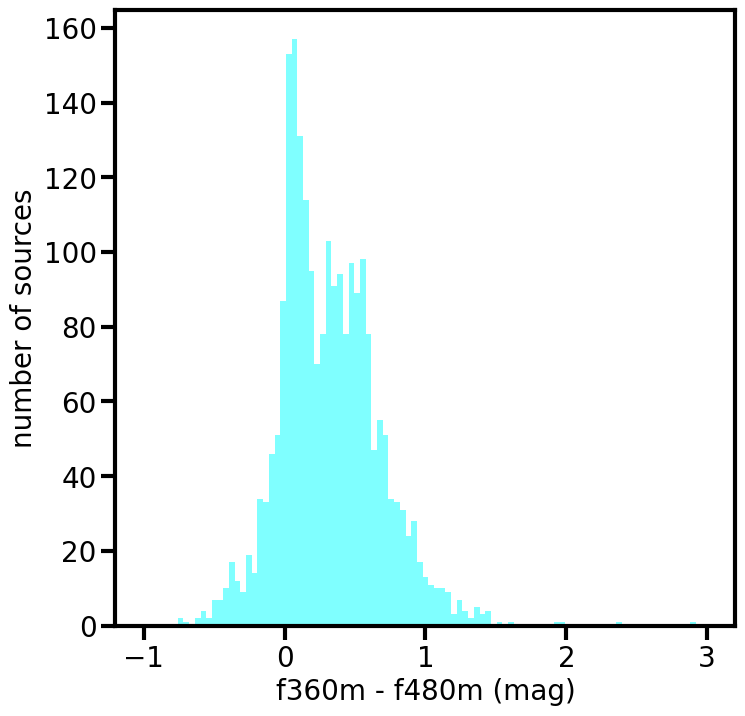

In [ ]:
#for each red sources, deredden it back to the isochrone using the extinction vector and plot the dereddened position in F182-f210 vs f360-f480 plot
color1 = filters['f182m'][0] - filters['f210m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
mag1 = filters['f182m'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
#ax.scatter(color1.value, color2.value, s=10, c='gray', alpha=0.5, edgecolor='none')

ext = CT06_MWLoc()
df360f480 = av_estimate * (ext(1/3.60/u.um) - ext(1/4.80/u.um))
f360f480_dereddened = color2.value - df360f480

bin = np.linspace(-1, 3, 100)
ax.hist(f360f480_dereddened, bins=bin, alpha=0.5, color='cyan', label='Dereddened f360m-f480m')
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('number of sources')

Best n_components (BIC): 5


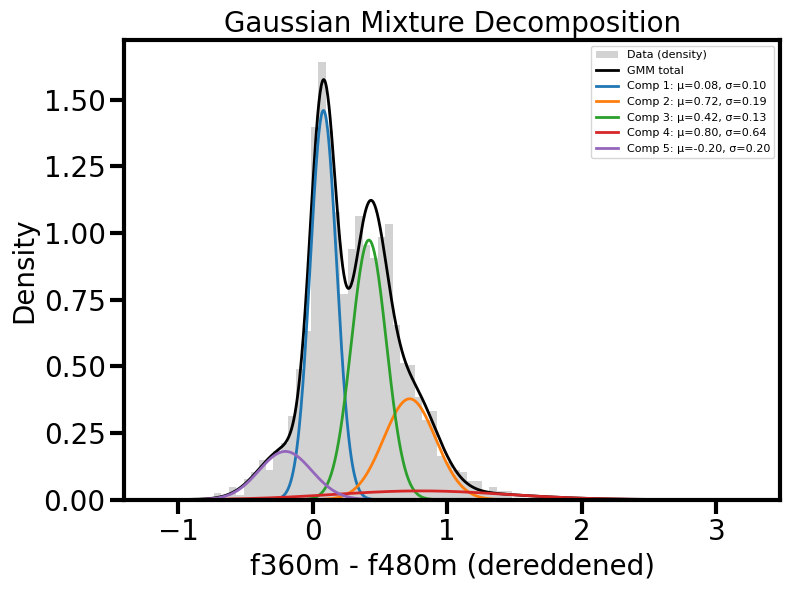

In [ ]:
from sklearn.mixture import GaussianMixture

# Use the dereddened color from the previous cell
x = np.asarray(f360f480_dereddened)
x = x[np.isfinite(x)].reshape(-1, 1)

# Pick number of Gaussian components by BIC
n_components_grid = range(1, 6)
models, bics = [], []
for k in n_components_grid:
    gmm_k = GaussianMixture(n_components=k, random_state=42)
    gmm_k.fit(x)
    models.append(gmm_k)
    bics.append(gmm_k.bic(x))

gmm = models[np.argmin(bics)]
print(f"Best n_components (BIC): {gmm.n_components}")

# Evaluate total PDF and each component PDF
xgrid = np.linspace(x.min(), x.max(), 1000).reshape(-1, 1)
logprob = gmm.score_samples(xgrid)
pdf = np.exp(logprob)
resp = gmm.predict_proba(xgrid)
pdf_components = resp * pdf[:, None]

# Plot histogram + GMM decomposition
fig, ax = plt.subplots(figsize=(8, 6))
ax.hist(x.ravel(), bins=80, density=True, alpha=0.35, color='gray', label='Data (density)')
ax.plot(xgrid, pdf, 'k-', lw=2, label='GMM total')

for i in range(gmm.n_components):
    ax.plot(
        xgrid, pdf_components[:, i],
        lw=2, label=f'Comp {i+1}: μ={gmm.means_[i,0]:.2f}, σ={np.sqrt(gmm.covariances_[i,0,0]):.2f}'
    )

ax.set_xlabel('f360m - f480m (dereddened)')
ax.set_ylabel('Density')
ax.set_title('Gaussian Mixture Decomposition')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()